File for the OLS models

# PPOL 5203 Final Project

## Creating OLS Models

In [2]:
#!pip install openpyxl

In [2]:
import pandas as pd
import os
import openpyxl
import math
import seaborn as sns
import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure

In [3]:
pwd

'C:\\Users\\bsullivan\\OneDrive - FI Consulting\\Documents\\GU\\Data Science 1\\PPOL5203_FinalProject\\Python_code'

In [4]:
#should be in the PPOL5203 folder not in subfolder
os.chdir("../")

In [5]:
Merged_County_Data_clean = pd.read_csv('Datasets/Clean_Data/NRI_county_health_data.csv', header=0)

In [6]:
# import library for models
import statsmodels.api as sm
import statsmodels.formula.api as smf
from plotnine import * # to imitate ggplot

In [11]:
Merged_County_Data_clean.columns

Index(['FIPS', 'STATEABBRV', 'State', 'County', 'County_State',
       'Community_Type', 'POPULATION', 'AREA', 'Population_Density',
       'Percent_Rural', 'RISK_SCORE', 'RISK_RATNG', 'EAL_SCORE', 'EAL_RATNG',
       'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE', 'RESL_RATNG',
       'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'Life_Expectancy',
       'Age-Adjusted_Death_Rate', 'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_Non-Hispanic_White', 'Percent_Femal

## OLS Using Data on All U.S. Counties

**Life Expectancy and Risk Score**

In [7]:
life_ex_model_ols_r_bivariate = smf.ols(formula='Life_Expectancy ~ RISK_SCORE', data=Merged_County_Data_clean).fit()

print(life_ex_model_ols_r_bivariate.summary())



                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     10.01
Date:                Wed, 29 Nov 2023   Prob (F-statistic):            0.00157
Time:                        12:03:28   Log-Likelihood:                -7986.7
No. Observations:                3071   AIC:                         1.598e+04
Df Residuals:                    3069   BIC:                         1.599e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     76.5603      0.121    632.298      0.0

In [8]:
life_ex_model_ols_r_mv1 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density', data=Merged_County_Data_clean).fit()


print(life_ex_model_ols_r_mv1.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     19.41
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           4.20e-09
Time:                        12:03:43   Log-Likelihood:                -7972.4
No. Observations:                3071   AIC:                         1.595e+04
Df Residuals:                    3068   BIC:                         1.597e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             76.6016      0

In [9]:
life_ex_model_ols_r_mv2 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density + Community_Type', data=Merged_County_Data_clean).fit()


print(life_ex_model_ols_r_mv2.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.071
Method:                 Least Squares   F-statistic:                     60.02
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           7.16e-49
Time:                        12:03:43   Log-Likelihood:                -7875.9
No. Observations:                3071   AIC:                         1.576e+04
Df Residuals:                    3066   BIC:                         1.579e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [12]:
#comparing population vs population_density in model
life_ex_model_ols_r_mv3 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density + Community_Type', data=Merged_County_Data_clean).fit()


print(life_ex_model_ols_r_mv3.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.071
Method:                 Least Squares   F-statistic:                     60.02
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           7.16e-49
Time:                        12:04:17   Log-Likelihood:                -7875.9
No. Observations:                3071   AIC:                         1.576e+04
Df Residuals:                    3066   BIC:                         1.579e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [77]:
life_ex_model_ols_r_int = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density + Community_Type + RISK_SCORE*Community_Type', data=Merged_County_Data_clean).fit()


print(life_ex_model_ols_r_int.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     41.09
Date:                Thu, 30 Nov 2023   Prob (F-statistic):           2.15e-48
Time:                        16:21:04   Log-Likelihood:                -7872.9
No. Observations:                3071   AIC:                         1.576e+04
Df Residuals:                    3064   BIC:                         1.580e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

**Age Adjusted Death Rate**

In [82]:
#won't run till we fix code

#dr_model_ols_r1 = smf.ols(formula='Age ~ RISK_SCORE + Population_Density + Community_Type + RISK_SCORE*Community_Type ', data=Merged_County_Data_clean).fit()
#
#print(dr_model_ols_r1.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     41.09
Date:                Thu, 30 Nov 2023   Prob (F-statistic):           2.15e-48
Time:                        16:27:09   Log-Likelihood:                -7872.9
No. Observations:                3071   AIC:                         1.576e+04
Df Residuals:                    3064   BIC:                         1.580e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [ ]:
dr_model_ols_r_sq = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + RISK_SCORE_SQ + Community_Type', data=Southeast_county_data).fit()

print(dr_model_ols_r_sq.summary())

**Mentally Unhealthy Days and Risk Score**

In [7]:
model_ols_r_mh1 = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ RISK_SCORE + Population_Density + Community_Type + RISK_SCORE*Community_Type', data=Merged_County_Data_clean).fit()


print(model_ols_r_mh1.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.013
Model:                                                   OLS   Adj. R-squared:                  0.011
Method:                                        Least Squares   F-statistic:                     6.950
Date:                                       Sun, 03 Dec 2023   Prob (F-statistic):           2.36e-07
Time:                                               19:20:51   Log-Likelihood:                -2971.6
No. Observations:                                       3140   AIC:                             5957.
Df Residuals:                                           3133   BIC:                             6000.
Df Model:                                                  6                                         
Covariance Type:                                   nonrobust                      

In [8]:
small_urban_int_mh1 = model_ols_r_mh1.params.iloc[0:2].sum() 
urban_int_mh1 = model_ols_r_mh1.params.iloc[0] + model_ols_r_mh1.params.iloc[2]
rural_int_mh1 = model_ols_r_mh1.params.iloc[0]

small_urban_slope_mh1 = model_ols_r_mh1.params.iloc[3] + model_ols_r_mh1.params.iloc[4]
urban_slope_mh1 = model_ols_r_mh1.params.iloc[3] + model_ols_r_mh1.params.iloc[5]
rural_slope_mh1 = model_ols_r_mh1.params.iloc[3]

C:\Users\bsullivan\.conda\envs\ppol5203\Lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


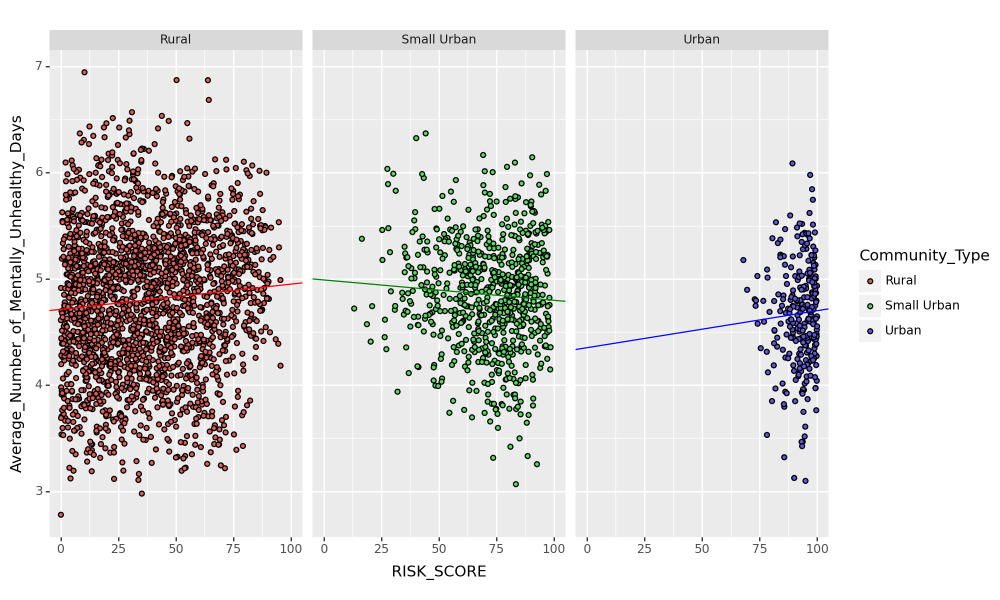

<Figure Size: (1000 x 600)>

In [9]:
lines_data_mh1 = pd.DataFrame({'intercept': [rural_int_mh1, small_urban_int_mh1, urban_int_mh1],
'slope':[rural_slope_mh1, small_urban_slope_mh1, urban_slope_mh1],
'Community_Type':['Rural', 'Small Urban', 'Urban']})
plot_mh_line_1 = (ggplot(Merged_County_Data_clean) + 
                  aes(x = 'RISK_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") + 
                  geom_point()  + facet_wrap('Community_Type') + theme(figure_size = (10,6 )))
plot_mh_line_1 + geom_abline(aes(intercept='intercept', slope='slope'), data = lines_data_mh1[lines_data_mh1['Community_Type'] == 'Rural'], color = 'red') + geom_abline(aes(intercept='intercept', slope='slope'), data = lines_data_mh1[lines_data_mh1['Community_Type'] == 'Small Urban'], color = "green")+ geom_abline(aes(intercept='intercept', slope='slope'), data = lines_data_mh1[lines_data_mh1['Community_Type'] == 'Urban'], color = "blue")

In [10]:
conf_int_mh1 = pd.DataFrame({'estimate': model_ols_r_mh1.params, 'lower': model_ols_r_mh1.params - model_ols_r_mh1.bse*3, 'upper':model_ols_r_mh1.params + model_ols_r_mh1.bse*3})
#conf_int_ph1['coefficient'] = conf_int_ph1.index
conf_int_mh1 = conf_int_mh1.reset_index().rename( columns = {'index': 'coefficient'})
conf_int_mh1

,coefficient,estimate,lower,upper
0,Intercept,4.713471,4.638182,4.788760
1,Community_Type[T.Small Urban],0.276725,-0.024430,0.577880
2,Community_Type[T.Urban],-0.361166,-1.975975,1.253644
3,RISK_SCORE,0.002373,0.000682,0.004063
4,RISK_SCORE:Community_Type[T.Small Urban],-0.004290,-0.008604,0.000025
5,RISK_SCORE:Community_Type[T.Urban],0.001110,-0.016434,0.018654
6,Population_Density,-0.000013,-0.000040,0.000015


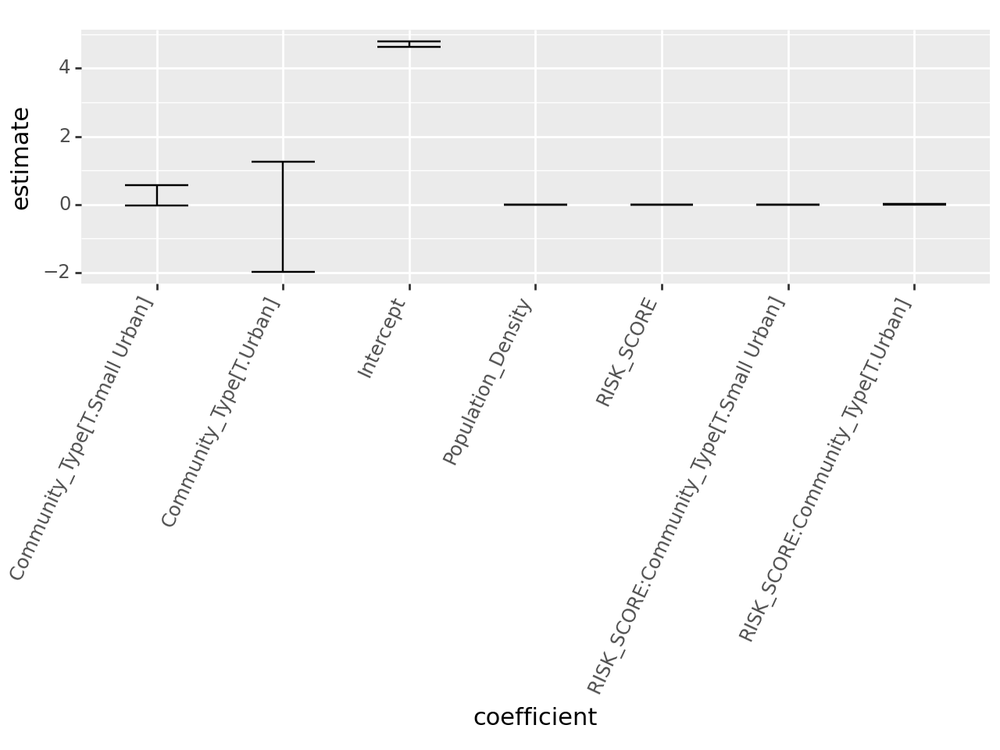

<Figure Size: (640 x 480)>

In [13]:
ggplot(conf_int_mh1) + geom_errorbar(aes(x = conf_int_mh1['coefficient'], y =conf_int_mh1['estimate'], ymin =conf_int_mh1['lower'], ymax =conf_int_mh1['upper'])) + theme(axis_text_x=element_text(rotation=65, hjust=1))

**Physically Unhealthy Days and Risk Score**

In [9]:
model_ols_r_ph1 = smf.ols(formula='Average_Number_of_Physically_Unhealthy_Days ~ RISK_SCORE + Population_Density + Community_Type + RISK_SCORE*Community_Type', data=Merged_County_Data_clean).fit()


print(model_ols_r_ph1.summary())

                                         OLS Regression Results                                        
Dep. Variable:     Average_Number_of_Physically_Unhealthy_Days   R-squared:                       0.089
Model:                                                     OLS   Adj. R-squared:                  0.087
Method:                                          Least Squares   F-statistic:                     51.11
Date:                                         Sat, 02 Dec 2023   Prob (F-statistic):           2.95e-60
Time:                                                 16:59:58   Log-Likelihood:                -2965.0
No. Observations:                                         3140   AIC:                             5944.
Df Residuals:                                             3133   BIC:                             5986.
Df Model:                                                    6                                         
Covariance Type:                                     nonrobust  

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

In [10]:
small_urban_int_ph1 = model_ols_r_ph1.params.iloc[0:2].sum() 
urban_int_ph1 = model_ols_r_ph1.params.iloc[0] + model_ols_r_ph1.params.iloc[2]
rural_int_ph1 = model_ols_r_ph1.params.iloc[0]

small_urban_slope_ph1 = model_ols_r_ph1.params.iloc[3] + model_ols_r_ph1.params.iloc[4]
urban_slope_ph1 = model_ols_r_ph1.params.iloc[3] + model_ols_r_ph1.params.iloc[5]
rural_slope_ph1 = model_ols_r_ph1.params.iloc[3]

C:\Users\bsullivan\.conda\envs\ppol5203\Lib\site-packages\plotnine\layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


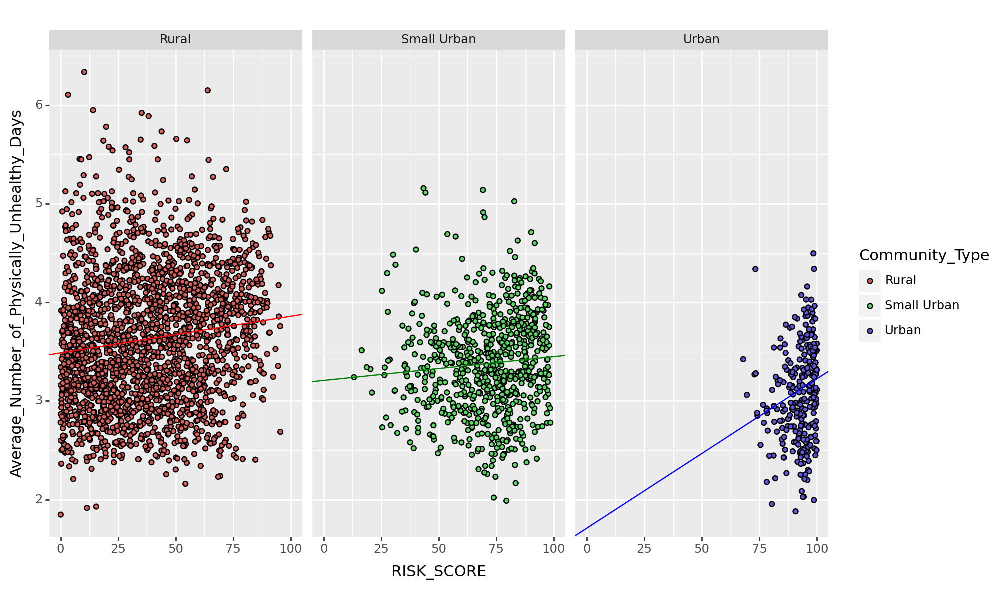

<Figure Size: (1000 x 600)>

In [120]:
lines_data_ph1 = pd.DataFrame({'intercept': [rural_int_ph1, small_urban_int_ph1, urban_int_ph1],
'slope':[rural_slope_ph1, small_urban_slope_ph1, urban_slope_ph1],
'Community_Type':['Rural', 'Small Urban', 'Urban']})
plot_ph1_line_1 = (ggplot(Merged_County_Data_clean) + 
                  aes(x = 'RISK_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") + 
                  geom_point()  + facet_wrap('Community_Type') + theme(figure_size = (10,6 )))
plot_ph1_line_1 + geom_abline(aes(intercept='intercept', slope='slope'), data = lines_data_ph1[lines_data_ph1['Community_Type'] == 'Rural'], color = 'red') + geom_abline(aes(intercept='intercept', slope='slope'), data = lines_data_ph1[lines_data_ph1['Community_Type'] == 'Small Urban'], color = "green")+ geom_abline(aes(intercept='intercept', slope='slope'), data = lines_data_ph1[lines_data_ph1['Community_Type'] == 'Urban'], color = "blue")

In [33]:
conf_int_ph1 = pd.DataFrame({'estimate': model_ols_r_ph1.params, 'lower': model_ols_r_ph1.params - model_ols_r_ph1.bse*3, 'upper':model_ols_r_ph1.params + model_ols_r_ph1.bse*3})
#conf_int_ph1['coefficient'] = conf_int_ph1.index
conf_int_ph1 = conf_int_ph1.reset_index().rename( columns = {'index': 'coefficient'})
conf_int_ph1

,coefficient,estimate,lower,upper
0,Intercept,3.487548,3.412416,3.562679e+00
1,Community_Type[T.Small Urban],-0.278903,-0.579427,2.162207e-02
2,Community_Type[T.Urban],-1.776951,-3.388379,-1.655229e-01
3,RISK_SCORE,0.003714,0.002027,5.400950e-03
4,RISK_SCORE:Community_Type[T.Small Urban],-0.001301,-0.005607,3.003942e-03
5,RISK_SCORE:Community_Type[T.Urban],0.011432,-0.006075,2.893914e-02
6,Population_Density,-0.000026,-0.000054,8.770148e-07


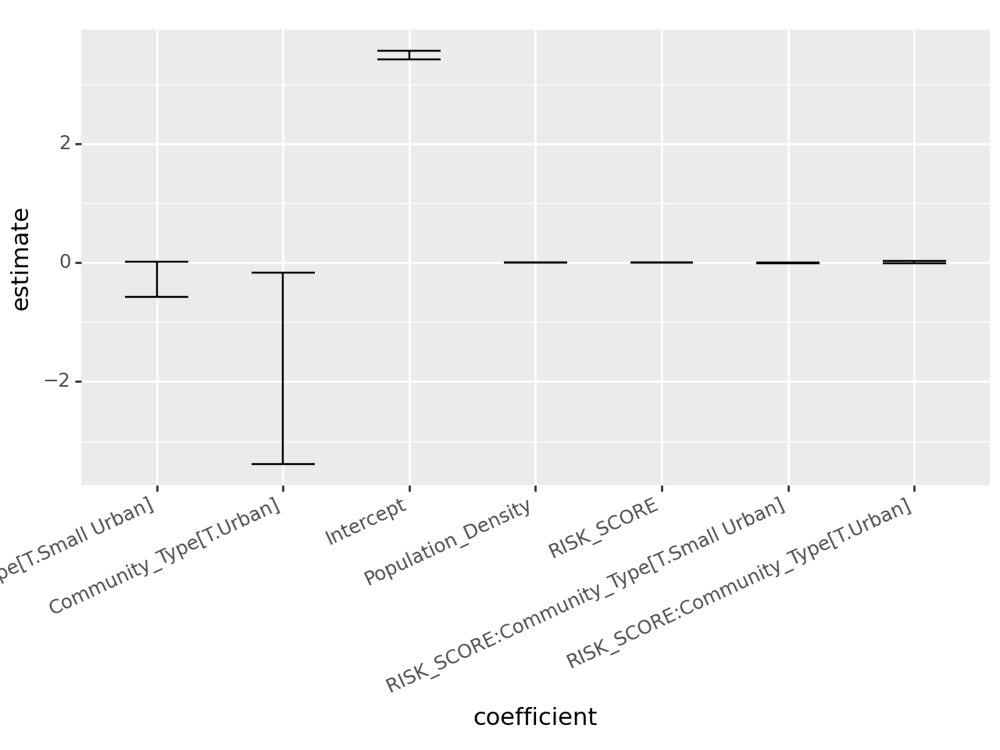

<Figure Size: (640 x 480)>

In [44]:
ggplot(conf_int_ph1) + geom_errorbar(aes(x = conf_int_ph1['coefficient'], y =conf_int_ph1['estimate'], ymin =conf_int_ph1['lower'], ymax =conf_int_ph1['upper'])) + theme(axis_text_x=element_text(rotation=25, hjust=1))

## Risk Score Broken into Components

In [94]:
life_ex_model_ols_r = smf.ols(formula='Life_Expectancy ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE', data=Merged_County_Data_clean).fit()

print(life_ex_model_ols_r.summary())


                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.315
Method:                 Least Squares   F-statistic:                     471.5
Date:                Thu, 30 Nov 2023   Prob (F-statistic):          6.32e-252
Time:                        16:37:00   Log-Likelihood:                -7409.3
No. Observations:                3071   AIC:                         1.483e+04
Df Residuals:                    3067   BIC:                         1.485e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     78.6476      0.197    399.612      0.0

In [95]:
life_ex_model_ols_r2 = smf.ols(formula='Life_Expectancy ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=Merged_County_Data_clean).fit()

print(life_ex_model_ols_r2.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.346
Model:                            OLS   Adj. R-squared:                  0.344
Method:                 Least Squares   F-statistic:                     269.6
Date:                Thu, 30 Nov 2023   Prob (F-statistic):          1.17e-277
Time:                        16:37:38   Log-Likelihood:                -7340.7
No. Observations:                3071   AIC:                         1.470e+04
Df Residuals:                    3064   BIC:                         1.474e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [96]:
model_ols_r_allscores_mh = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=Merged_County_Data_clean).fit()

print(model_ols_r_allscores_mh.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.203
Model:                                                   OLS   Adj. R-squared:                  0.201
Method:                                        Least Squares   F-statistic:                     132.7
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):          4.55e-150
Time:                                               16:38:57   Log-Likelihood:                -2636.9
No. Observations:                                       3140   AIC:                             5288.
Df Residuals:                                           3133   BIC:                             5330.
Df Model:                                                  6                                         
Covariance Type:                                   nonrobust                      

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


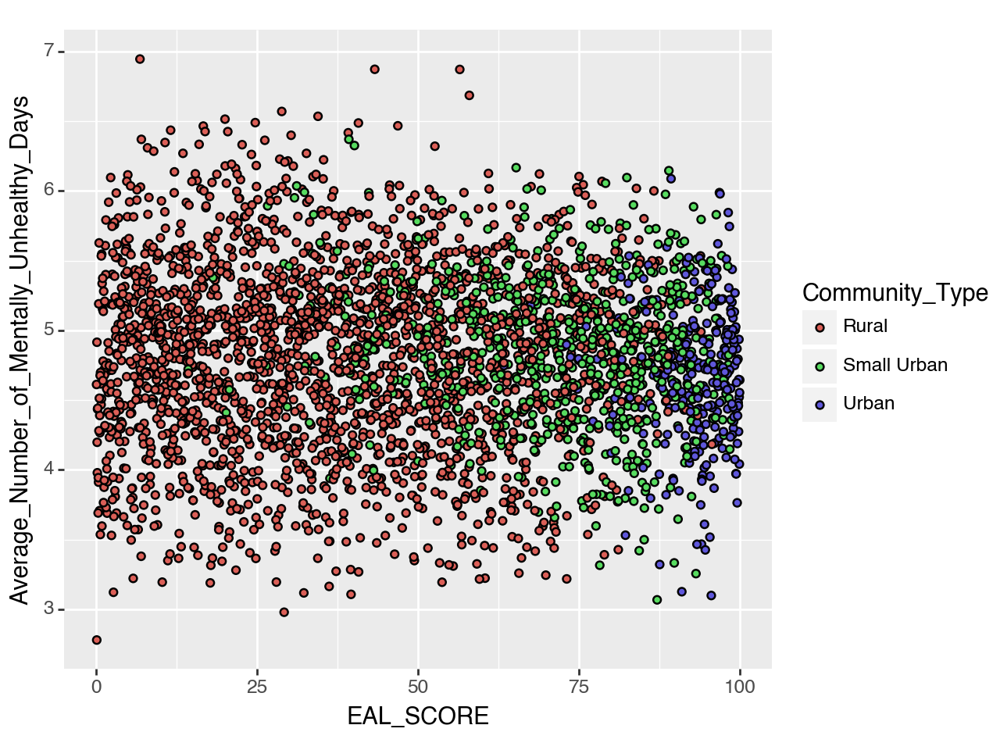

<Figure Size: (640 x 480)>

In [108]:
(ggplot(Merged_County_Data_clean) + aes(x = 'EAL_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


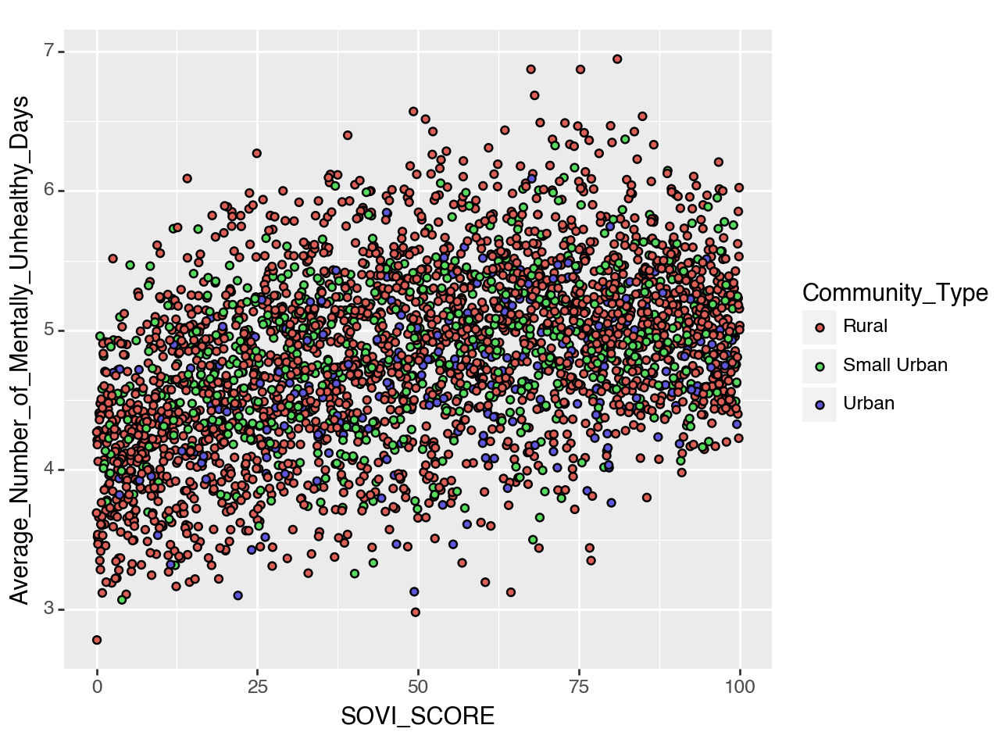

<Figure Size: (640 x 480)>

In [106]:
(ggplot(Merged_County_Data_clean) + aes(x = 'SOVI_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


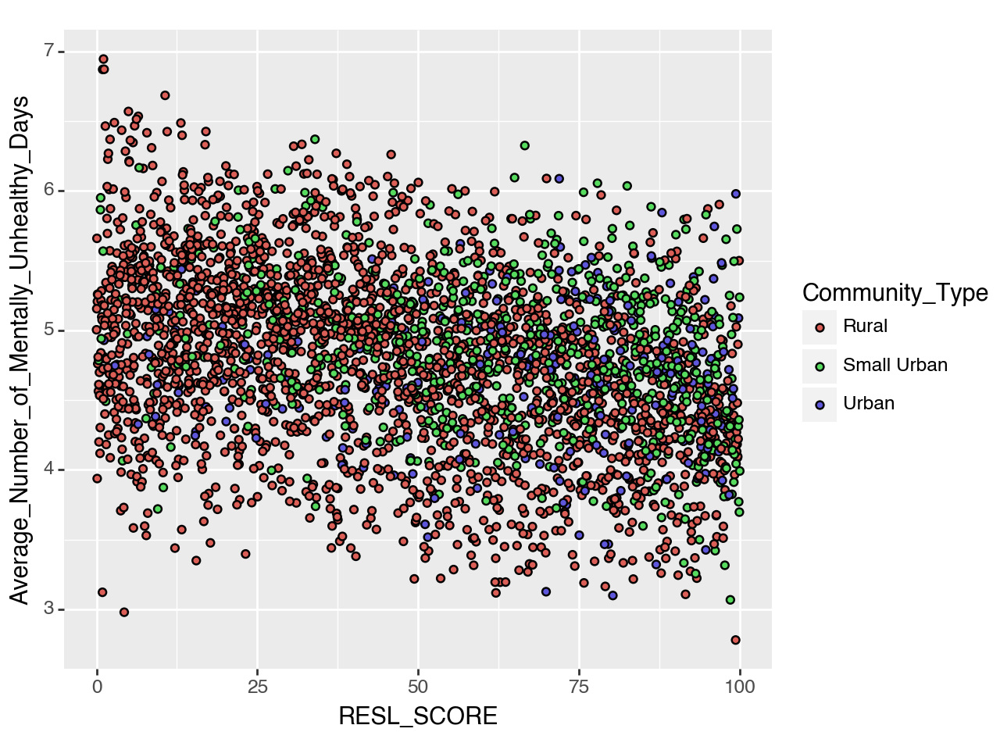

<Figure Size: (640 x 480)>

In [107]:
(ggplot(Merged_County_Data_clean) + aes(x = 'RESL_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

In [97]:
model_ols_r_allscores_ph = smf.ols(formula='Average_Number_of_Physically_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=Merged_County_Data_clean).fit()

print(model_ols_r_allscores_ph.summary())

                                         OLS Regression Results                                        
Dep. Variable:     Average_Number_of_Physically_Unhealthy_Days   R-squared:                       0.552
Model:                                                     OLS   Adj. R-squared:                  0.552
Method:                                          Least Squares   F-statistic:                     644.4
Date:                                         Thu, 30 Nov 2023   Prob (F-statistic):               0.00
Time:                                                 16:39:34   Log-Likelihood:                -1849.6
No. Observations:                                         3140   AIC:                             3713.
Df Residuals:                                             3133   BIC:                             3756.
Df Model:                                                    6                                         
Covariance Type:                                     nonrobust  

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


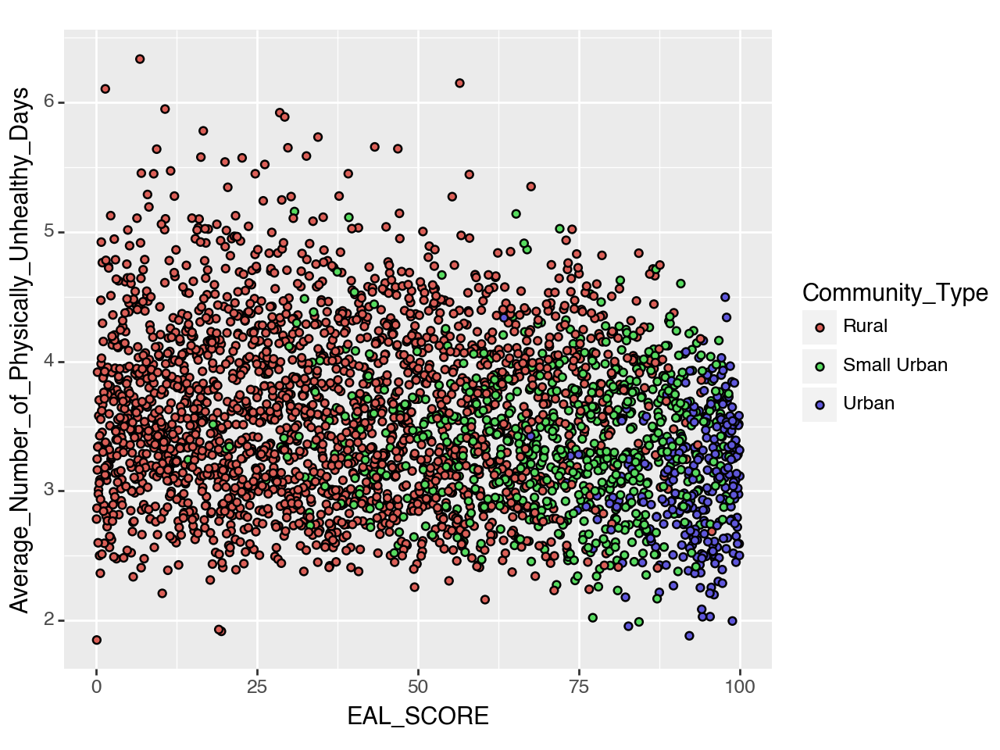

<Figure Size: (640 x 480)>

In [109]:
(ggplot(Merged_County_Data_clean) + aes(x = 'EAL_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


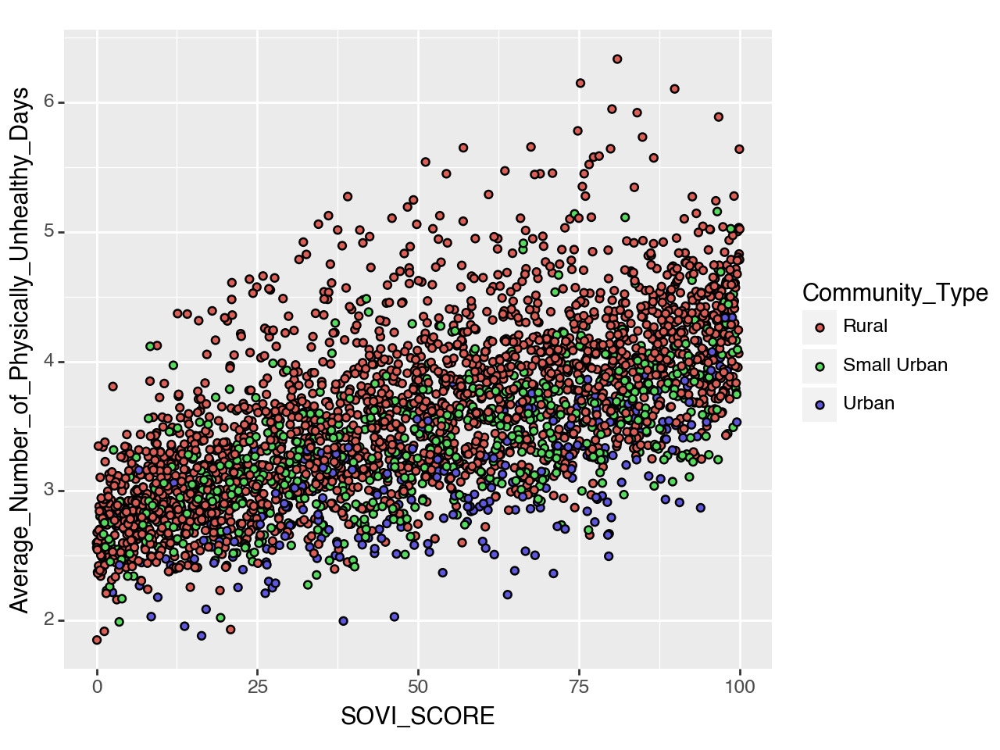

<Figure Size: (640 x 480)>

In [105]:
(ggplot(Merged_County_Data_clean) + aes(x = 'SOVI_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


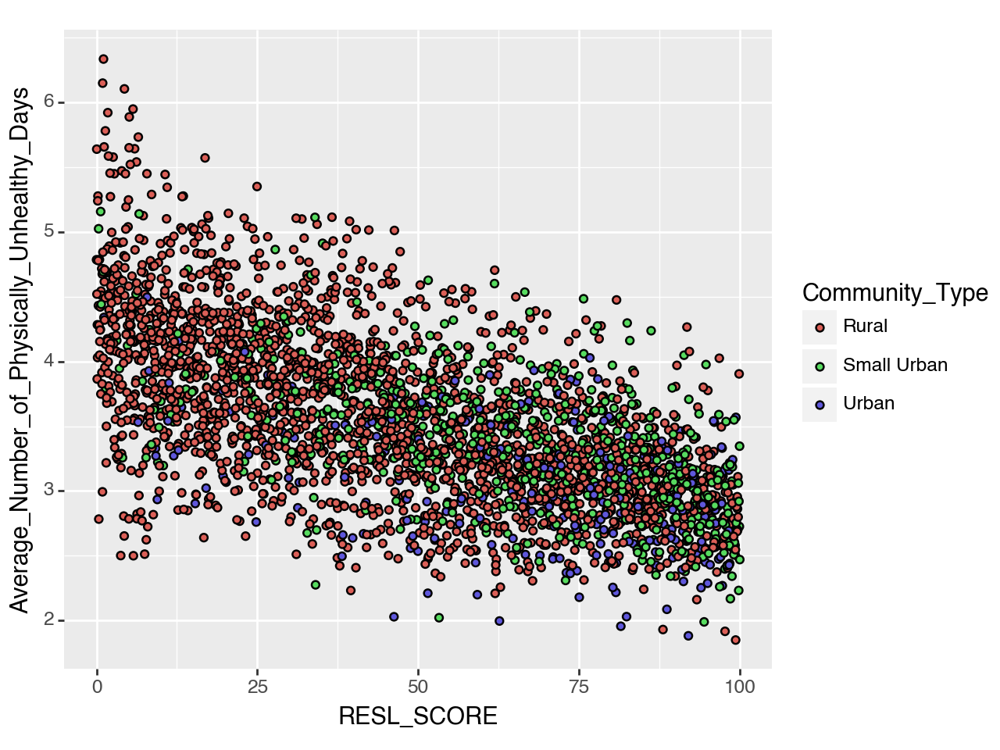

<Figure Size: (640 x 480)>

In [104]:
(ggplot(Merged_County_Data_clean) + aes(x = 'RESL_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

# Southeast OLS models

In [24]:
Southeast_county_data = pd.read_csv('Datasets/Clean_Data/NRI_county_health_data_southeast.csv', header=0)

In [27]:
Southeast_county_data.columns

Index(['FIPS', 'STATEABBRV', 'State', 'County', 'County_State',
       'Community_Type', 'POPULATION', 'AREA', 'Population_Density',
       'Percent_Rural', 'RISK_SCORE', 'RISK_RATNG', 'EAL_SCORE', 'EAL_RATNG',
       'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE', 'RESL_RATNG',
       'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'Life_Expectancy',
       'Age_Adjusted_Death_Rate', 'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_Non_Hispanic_White', 'Percent_Femal

**Life Expectancy and Risk Score**

In [29]:
se_model_ols_r_bivariate = smf.ols(formula='Life_Expectancy ~ RISK_SCORE', data=Southeast_county_data).fit()

print(se_model_ols_r_bivariate.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                     31.91
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           2.16e-08
Time:                        15:01:45   Log-Likelihood:                -2285.4
No. Observations:                 922   AIC:                             4575.
Df Residuals:                     920   BIC:                             4584.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     74.2571      0.196    378.879      0.0

In [32]:
Southeast_county_data['RISK_SCORE_SQ'] = Southeast_county_data['RISK_SCORE']**2 


In [34]:
se_model_ols_r_sq = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + RISK_SCORE_SQ', data=Southeast_county_data).fit()

print(se_model_ols_r_sq.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.098
Model:                            OLS   Adj. R-squared:                  0.096
Method:                 Least Squares   F-statistic:                     49.86
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           2.76e-21
Time:                        15:03:48   Log-Likelihood:                -2253.6
No. Observations:                 922   AIC:                             4513.
Df Residuals:                     919   BIC:                             4528.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        76.0746      0.294    259.020

In [141]:
se_model_ols_r_sq2 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + RISK_SCORE_SQ + Community_Type + Population_Density', data=Southeast_county_data).fit()

print(se_model_ols_r_sq2.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.237
Model:                            OLS   Adj. R-squared:                  0.233
Method:                 Least Squares   F-statistic:                     56.87
Date:                Thu, 30 Nov 2023   Prob (F-statistic):           1.45e-51
Time:                        21:12:06   Log-Likelihood:                -2176.5
No. Observations:                 922   AIC:                             4365.
Df Residuals:                     916   BIC:                             4394.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [142]:
#no squared term but interaction between community and risk score
se_model_ols_r_int = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density + Community_Type + RISK_SCORE*Community_Type', data=Southeast_county_data).fit()

print(se_model_ols_r_int.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.220
Method:                 Least Squares   F-statistic:                     44.37
Date:                Thu, 30 Nov 2023   Prob (F-statistic):           9.95e-48
Time:                        21:12:30   Log-Likelihood:                -2183.4
No. Observations:                 922   AIC:                             4381.
Df Residuals:                     915   BIC:                             4415.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

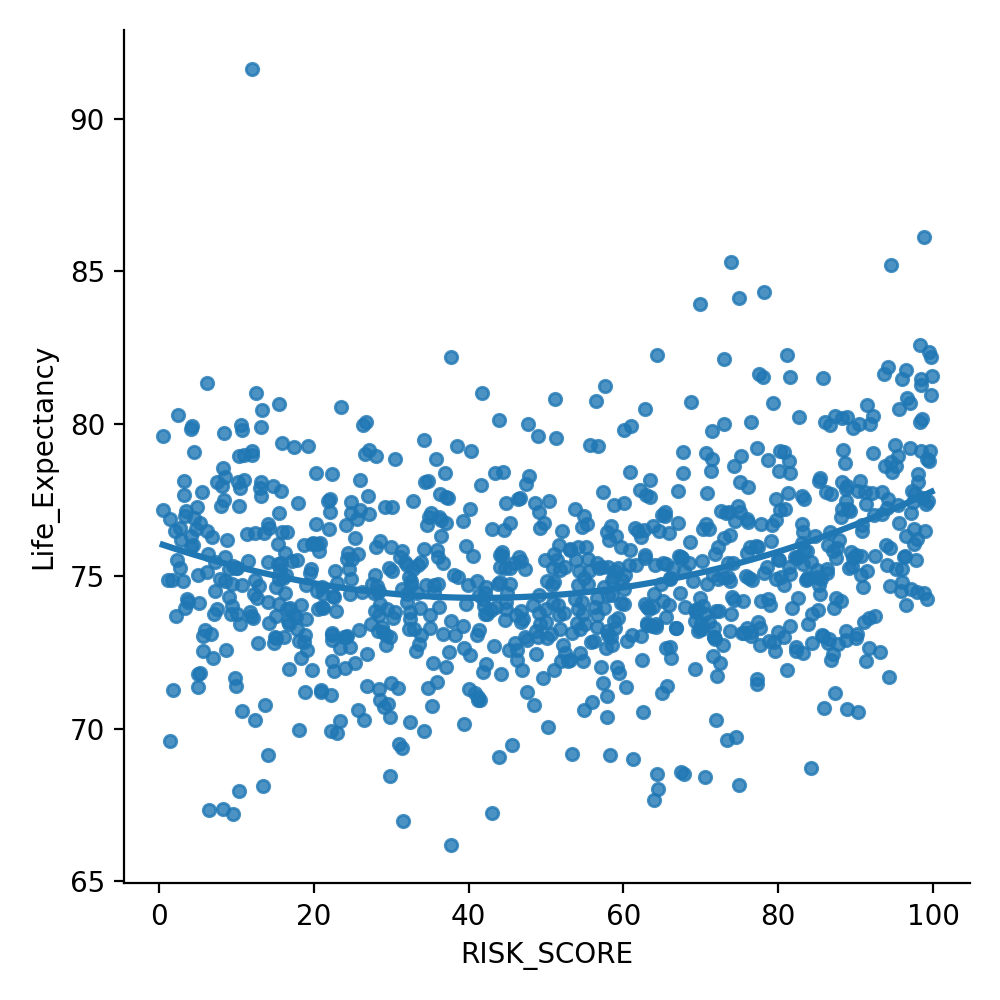

In [151]:
sns.lmplot(x="RISK_SCORE", y="Life_Expectancy", data=Southeast_county_data,
           order=2, ci=None, scatter_kws={"s": 20})

plt.show()

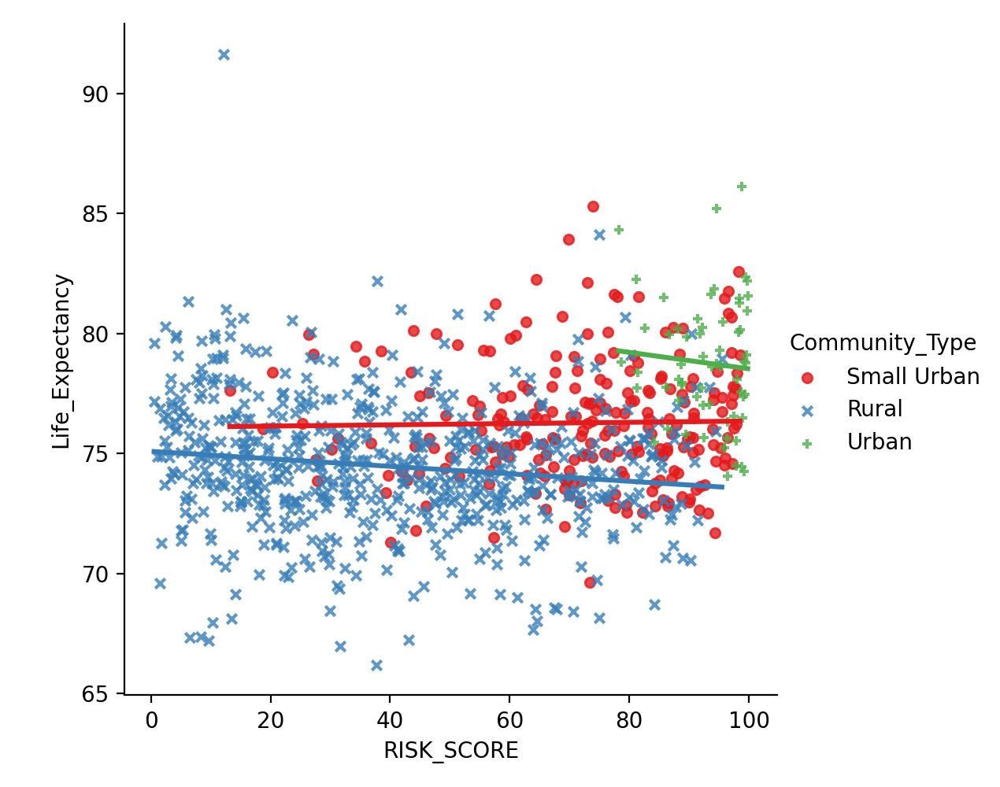

In [158]:
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Life_Expectancy", 
           hue = "Community_Type", markers = ["o", "x", "+"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

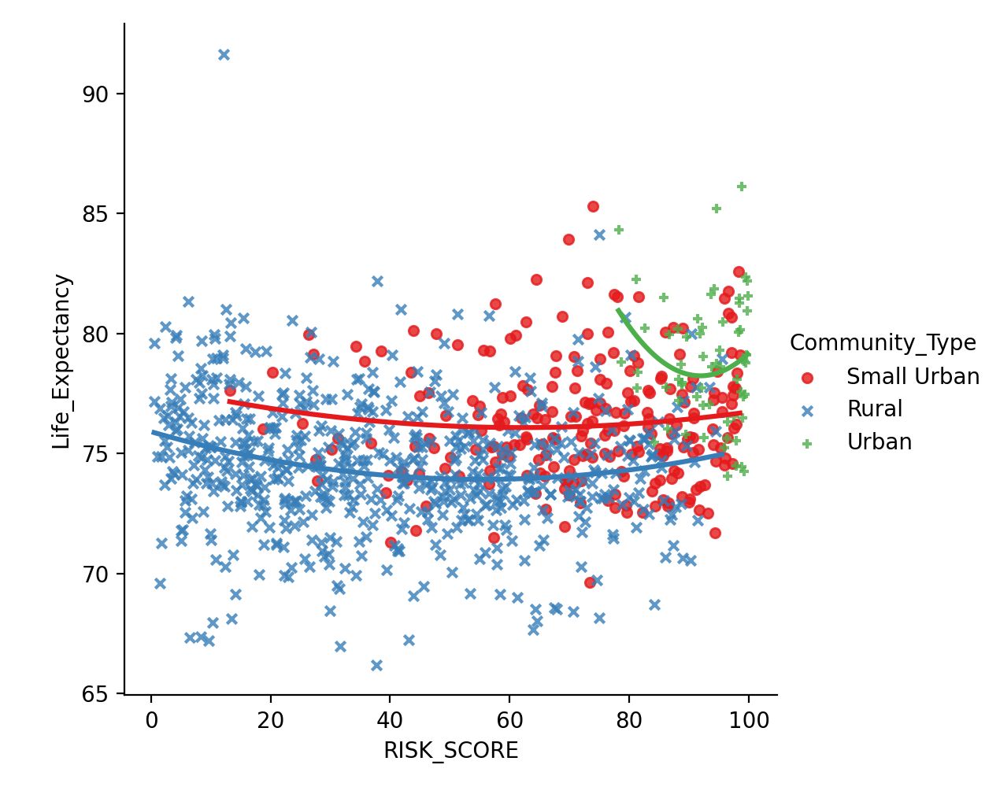

In [181]:
#quadratic model control for community type
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Life_Expectancy", 
           order=2,
           hue = "Community_Type", markers = ["o", "x", "+"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

**Age-adjusted Death Rate and Risk Score**

In [36]:
se_model_ols_r_sq = smf.ols(formula='Age_Adjusted_Death_Rate ~ RISK_SCORE + RISK_SCORE_SQ', data=Southeast_county_data).fit()

print(se_model_ols_r_sq.summary())

                               OLS Regression Results                              
Dep. Variable:     Age_Adjusted_Death_Rate   R-squared:                       0.082
Model:                                 OLS   Adj. R-squared:                  0.080
Method:                      Least Squares   F-statistic:                     41.19
Date:                     Wed, 29 Nov 2023   Prob (F-statistic):           7.34e-18
Time:                             15:07:05   Log-Likelihood:                -5730.6
No. Observations:                      924   AIC:                         1.147e+04
Df Residuals:                          921   BIC:                         1.148e+04
Df Model:                                2                                         
Covariance Type:                 nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [143]:
se_model_ols_r_sq2 = smf.ols(formula='Age_Adjusted_Death_Rate ~ RISK_SCORE + RISK_SCORE_SQ + Community_Type + Population_Density', data=Southeast_county_data).fit()

print(se_model_ols_r_sq2.summary())

                               OLS Regression Results                              
Dep. Variable:     Age_Adjusted_Death_Rate   R-squared:                       0.228
Model:                                 OLS   Adj. R-squared:                  0.224
Method:                      Least Squares   F-statistic:                     54.29
Date:                     Thu, 30 Nov 2023   Prob (F-statistic):           1.87e-49
Time:                             21:14:01   Log-Likelihood:                -5650.5
No. Observations:                      924   AIC:                         1.131e+04
Df Residuals:                          918   BIC:                         1.134e+04
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

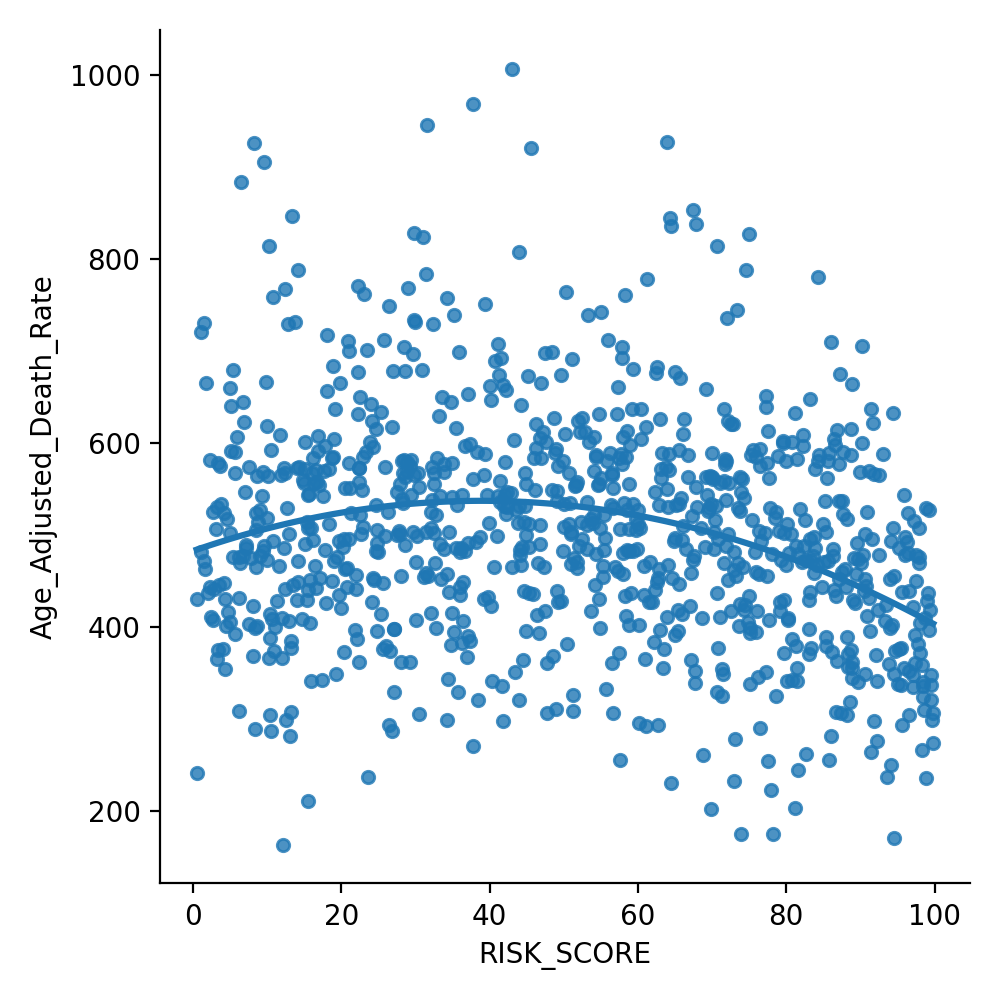

In [160]:
sns.lmplot(x="RISK_SCORE", y="Age_Adjusted_Death_Rate", data=Southeast_county_data,
           order=2, ci=None, scatter_kws={"s": 20})

plt.show()

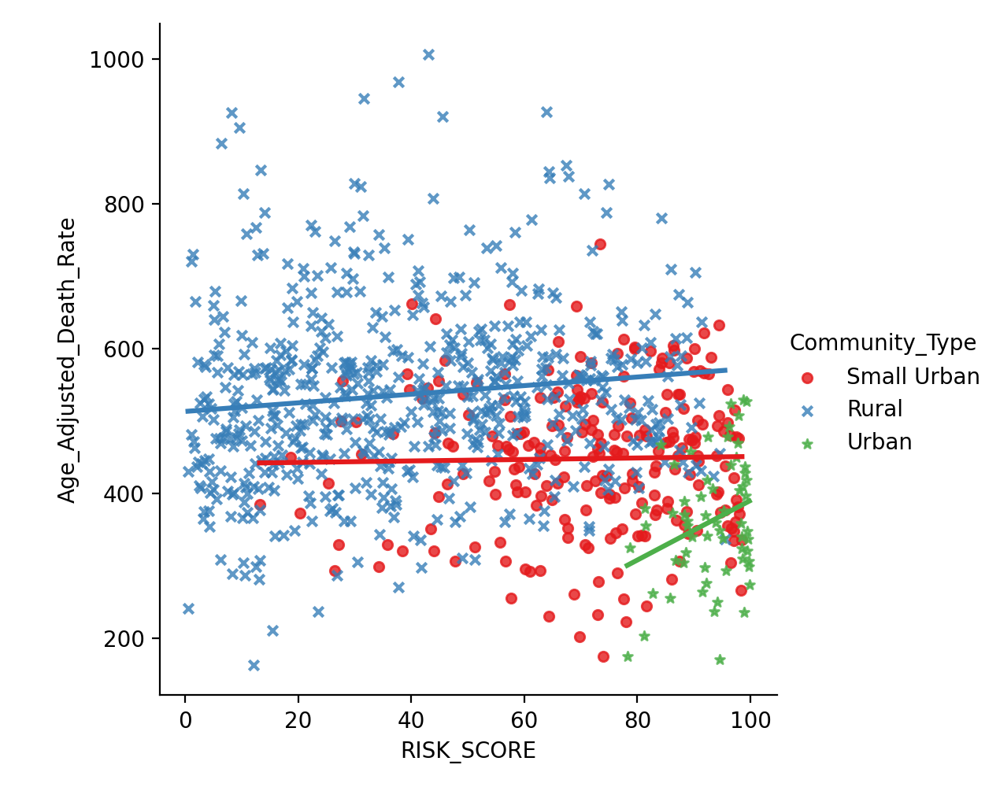

In [182]:
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Age_Adjusted_Death_Rate", 
           hue = "Community_Type", markers = ["o", "x", "*"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

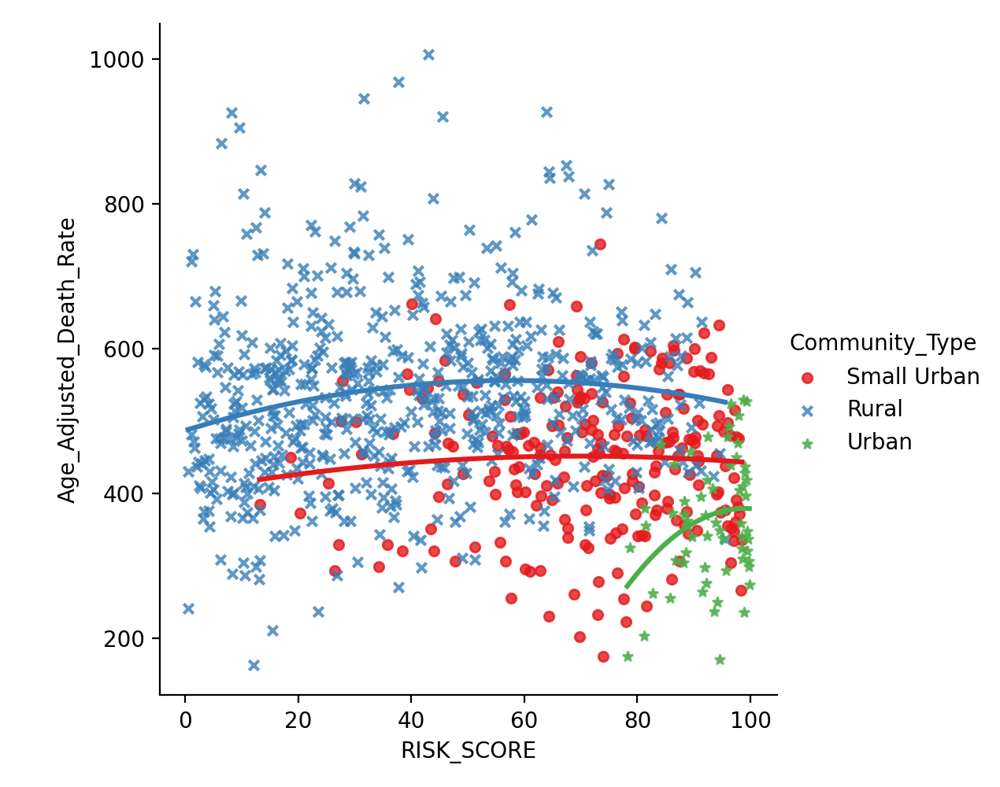

In [163]:
#quadratic model control for community type
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Age_Adjusted_Death_Rate", 
           order=2,
           hue = "Community_Type", markers = ["o", "x", "*"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

In [39]:
se_model_ols_r_int = smf.ols(formula='Age_Adjusted_Death_Rate ~ RISK_SCORE + RISK_SCORE_SQ + Population_Density + Community_Type + RISK_SCORE*Community_Type', data=Southeast_county_data).fit()

print(se_model_ols_r_int.summary())

                               OLS Regression Results                              
Dep. Variable:     Age_Adjusted_Death_Rate   R-squared:                       0.232
Model:                                 OLS   Adj. R-squared:                  0.226
Method:                      Least Squares   F-statistic:                     39.49
Date:                     Wed, 29 Nov 2023   Prob (F-statistic):           1.27e-48
Time:                             21:20:21   Log-Likelihood:                -5648.3
No. Observations:                      924   AIC:                         1.131e+04
Df Residuals:                          916   BIC:                         1.135e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

In [49]:
beta1pop = se_model_ols_r_int.params[-1]

In [65]:
SE = Southeast_county_data.copy()

SE['age_pop'] = SE['Age_Adjusted_Death_Rate'] - (beta1pop*(SE['Population_Density'].mean()))

print(SE['age_pop'].head())
print(SE['Age_Adjusted_Death_Rate'].head())
beta1pop * SE['Population_Density'].mean()

SE.head()

0    434.839982
1    389.468687
2    597.332750
3    575.274802
4    540.603138
Name: age_pop, dtype: float64
0    427.073326
1    381.702031
2    589.566095
3    567.508146
4    532.836482
Name: Age_Adjusted_Death_Rate, dtype: float64


,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Age_Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non_Hispanic_White,Percent_Female,Geolocation,RISK_SCORE_SQ,age_pop
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,427.073326,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367),2422.656634,434.839982
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,381.702031,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183),9547.086795,389.468687
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,589.566095,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531),3157.131246,597.332750
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,567.508146,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929),1055.267887,575.274802
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,532.836482,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575),4241.768116,540.603138


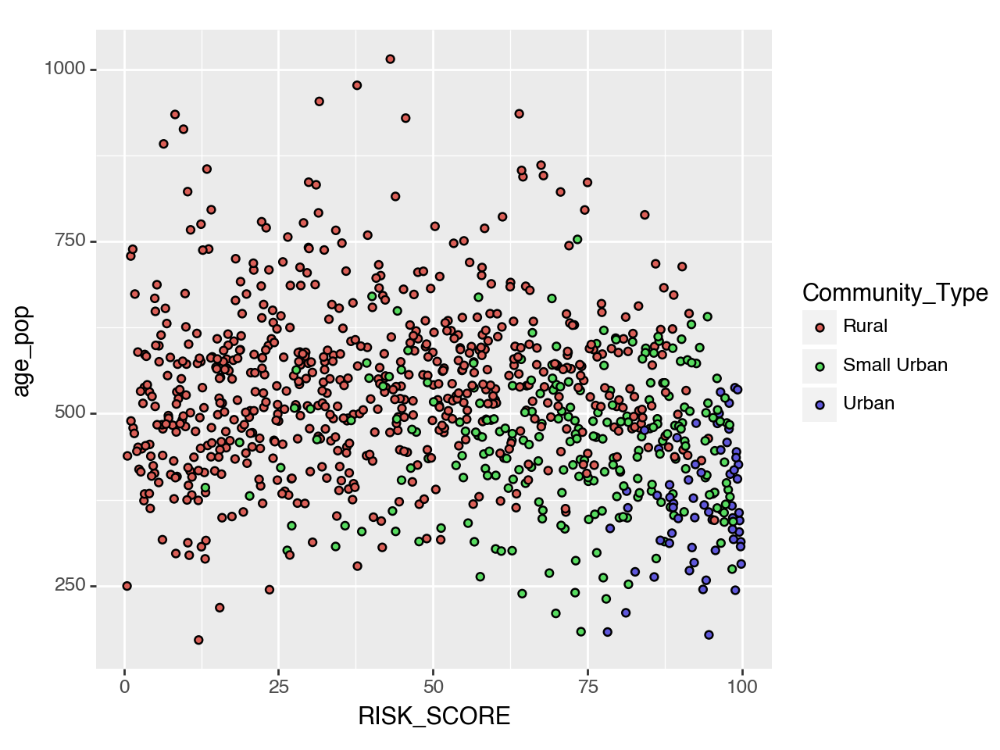

<Figure Size: (640 x 480)>

In [63]:
(ggplot(SE) + aes(x = 'RISK_SCORE', y = 'age_pop', fill = "Community_Type") + geom_point())

**Physically Unhealthy and Risk Score**

In [69]:
phys_model_ols_r_int = smf.ols(formula='Average_Number_of_Physically_Unhealthy_Days ~ RISK_SCORE + Population_Density + Community_Type + RISK_SCORE*Community_Type', data=Southeast_county_data).fit()

print(phys_model_ols_r_int.summary())

                                         OLS Regression Results                                        
Dep. Variable:     Average_Number_of_Physically_Unhealthy_Days   R-squared:                       0.247
Model:                                                     OLS   Adj. R-squared:                  0.242
Method:                                          Least Squares   F-statistic:                     50.07
Date:                                         Wed, 29 Nov 2023   Prob (F-statistic):           2.44e-53
Time:                                                 21:39:54   Log-Likelihood:                -792.70
No. Observations:                                          924   AIC:                             1599.
Df Residuals:                                              917   BIC:                             1633.
Df Model:                                                    6                                         
Covariance Type:                                     nonrobust  

In [73]:
beta1pop = phys_model_ols_r_int.params[-1]

SE['phys_pop'] = SE['Average_Number_of_Physically_Unhealthy_Days'] - (beta1pop*(SE['Population_Density'].mean()))

SE.head()

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,AREA,Population_Density,Percent_Rural,...,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_Non_Hispanic_White,Percent_Female,Geolocation,RISK_SCORE_SQ,age_pop,phys_pop
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small Urban,58764.0,610.470508,96.260178,42.002162,...,10.7,16.2,23.406380,16.048735,72.454522,51.378289,POINT (-86.6464395 32.5322367),2422.656634,434.839982,3.486570
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small Urban,231365.0,2047.738775,112.985603,42.279099,...,9.9,16.1,21.218250,21.469824,83.148763,51.347715,POINT (-87.7460666 30.6592183),9547.086795,389.468687,3.330536
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,913.646511,27.538003,67.789635,...,14.9,18.0,20.549591,19.976767,45.305240,46.703253,POINT (-85.4051035 31.8702531),3157.131246,597.332750,4.659791
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,632.486798,35.161208,68.352607,...,12.7,17.4,20.118343,16.737109,73.564088,46.015927,POINT (-87.1271475 33.0158929),1055.267887,575.274802,4.066541
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small Urban,58992.0,657.196555,89.763100,89.951502,...,11.9,17.4,23.053471,18.725970,86.329839,50.192239,POINT (-86.56644 33.9773575),4241.768116,540.603138,3.920407


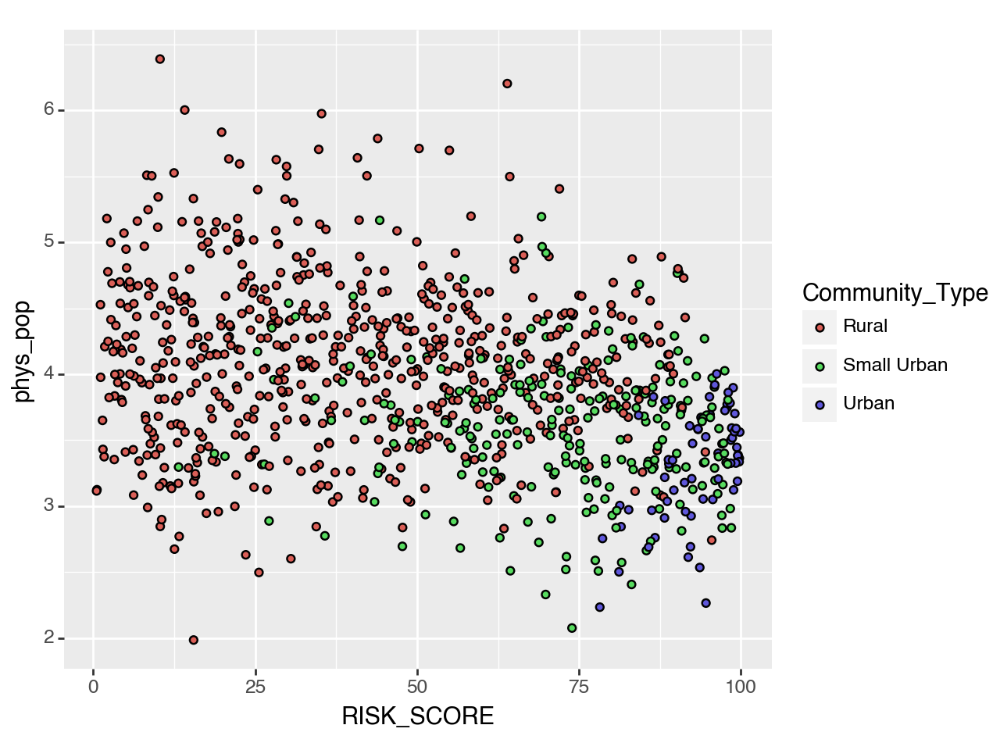

<Figure Size: (640 x 480)>

In [71]:
(ggplot(SE) + aes(x = 'RISK_SCORE', y = 'phys_pop', fill = "Community_Type") + geom_point())



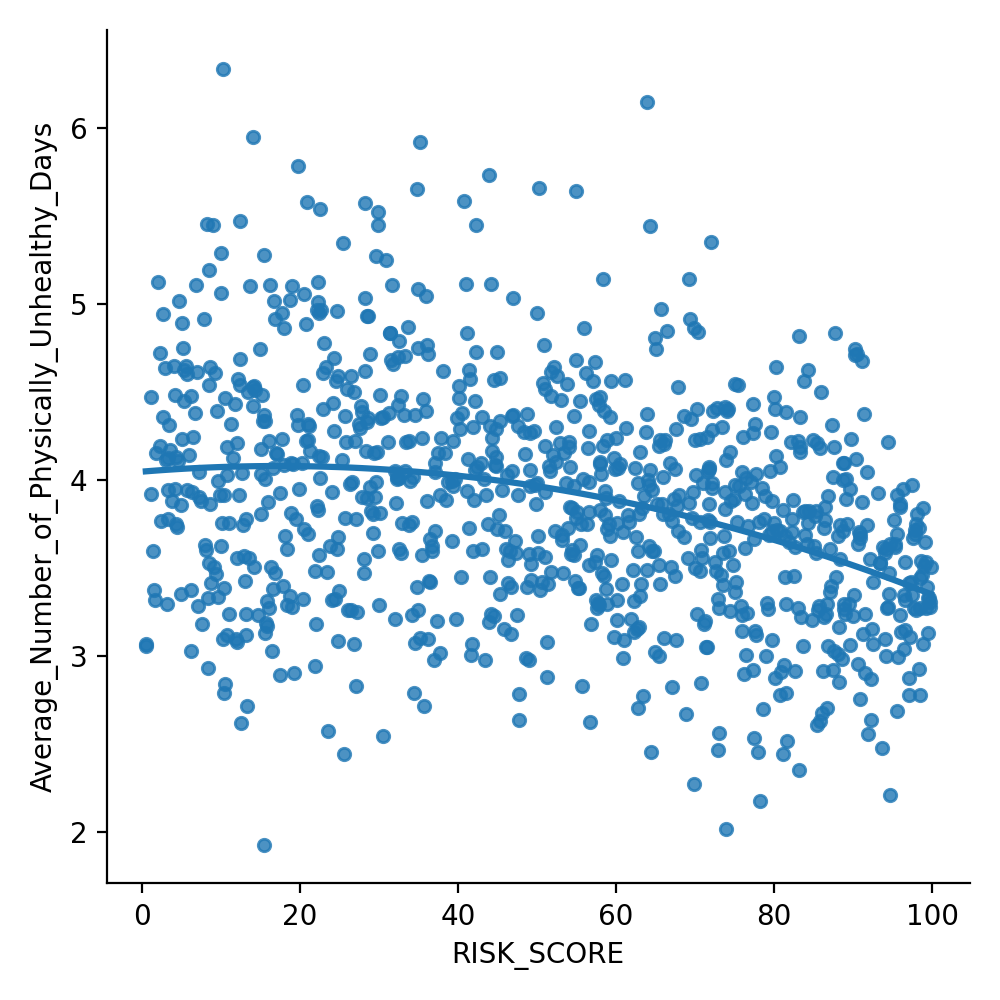

In [169]:
sns.lmplot(x="RISK_SCORE", y="Average_Number_of_Physically_Unhealthy_Days", data=Southeast_county_data,
           order=2, ci=None, scatter_kws={"s": 20})

plt.show()

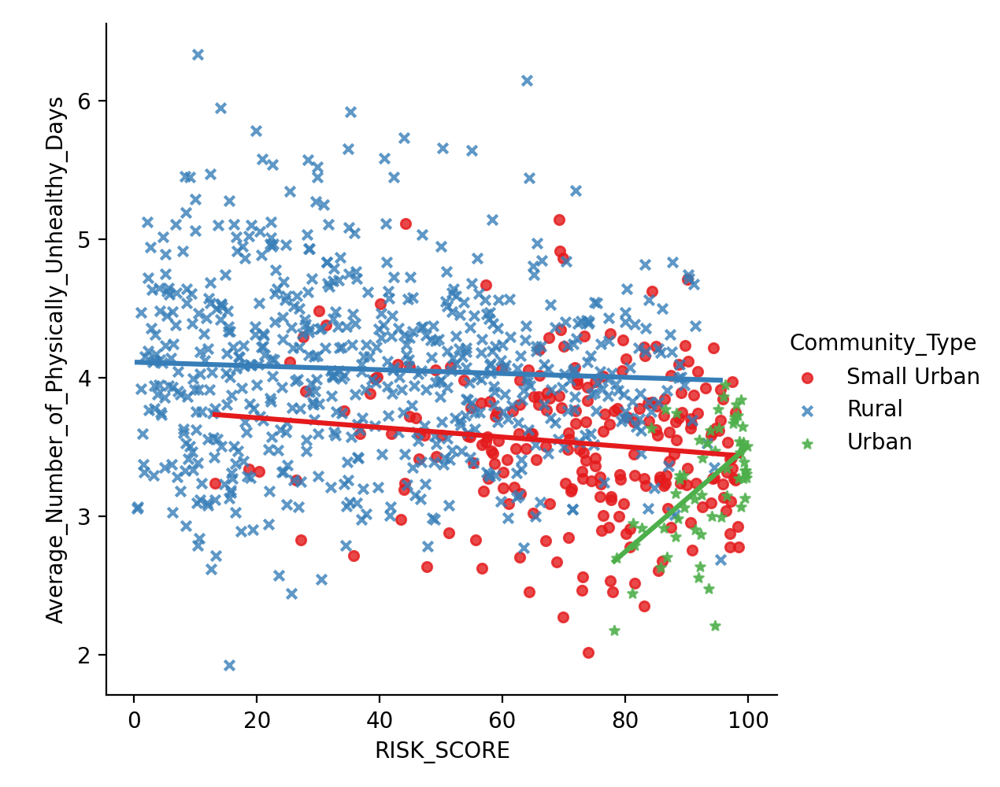

In [171]:
#linear model
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Average_Number_of_Physically_Unhealthy_Days", 
           hue = "Community_Type", markers = ["o", "x", "*"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

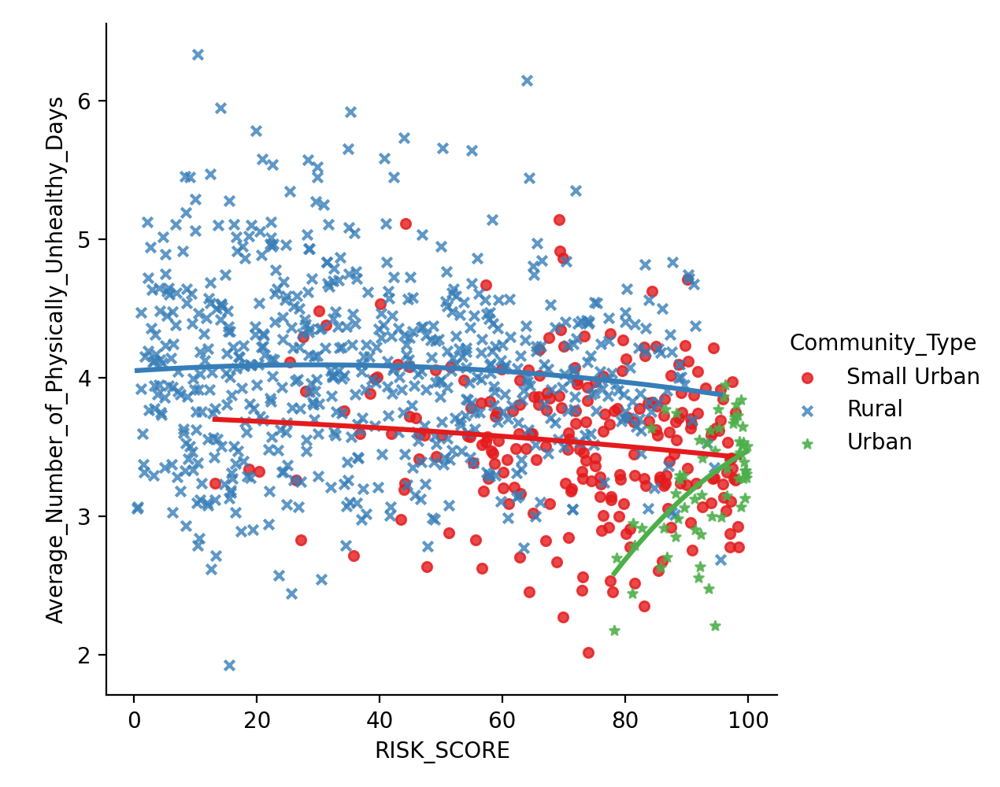

In [180]:
#quadratic model control for community type
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Average_Number_of_Physically_Unhealthy_Days", 
           order=2,
           hue = "Community_Type", markers = ["o", "x", "*"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

**Mentally Unhealthy Days**

In [165]:
ment_model_ols_r_int = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ RISK_SCORE + Population_Density + Community_Type + Community_Type*RISK_SCORE', data=Southeast_county_data).fit()

print(ment_model_ols_r_int.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.170
Model:                                                   OLS   Adj. R-squared:                  0.165
Method:                                        Least Squares   F-statistic:                     31.31
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           2.44e-34
Time:                                               21:39:47   Log-Likelihood:                -711.52
No. Observations:                                        924   AIC:                             1437.
Df Residuals:                                            917   BIC:                             1471.
Df Model:                                                  6                                         
Covariance Type:                                   nonrobust                      

In [167]:
ment_model_ols_r_sq = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ RISK_SCORE + RISK_SCORE_SQ + Population_Density + Community_Type', data=Southeast_county_data).fit()

print(ment_model_ols_r_sq.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.165
Model:                                                   OLS   Adj. R-squared:                  0.161
Method:                                        Least Squares   F-statistic:                     36.40
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           4.51e-34
Time:                                               21:40:32   Log-Likelihood:                -714.06
No. Observations:                                        924   AIC:                             1440.
Df Residuals:                                            918   BIC:                             1469.
Df Model:                                                  5                                         
Covariance Type:                                   nonrobust                      

In [168]:
ment_model_ols_r_sq = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ RISK_SCORE + RISK_SCORE_SQ + Population_Density + Community_Type + Community_Type*RISK_SCORE', data=Southeast_county_data).fit()

print(ment_model_ols_r_sq.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.179
Model:                                                   OLS   Adj. R-squared:                  0.172
Method:                                        Least Squares   F-statistic:                     28.48
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           1.29e-35
Time:                                               21:41:20   Log-Likelihood:                -706.64
No. Observations:                                        924   AIC:                             1429.
Df Residuals:                                            916   BIC:                             1468.
Df Model:                                                  7                                         
Covariance Type:                                   nonrobust                      

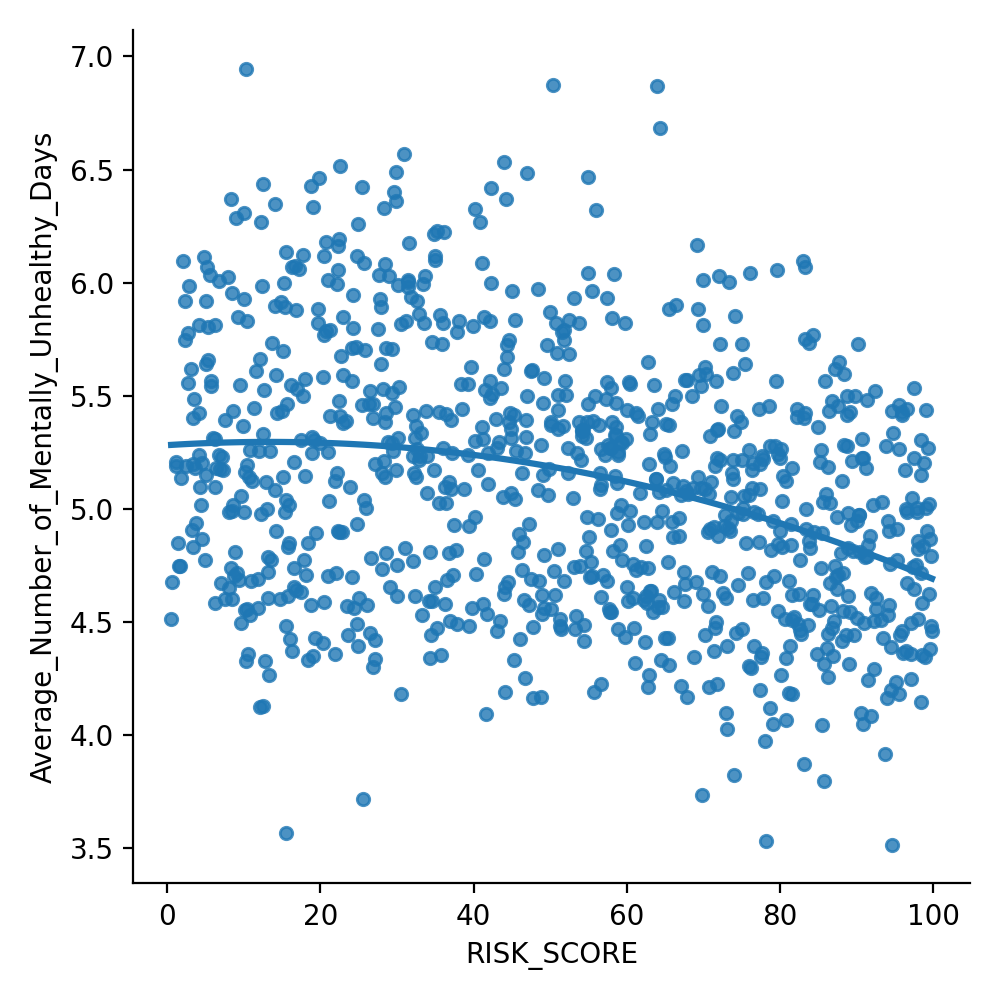

In [172]:
sns.lmplot(x="RISK_SCORE", y="Average_Number_of_Mentally_Unhealthy_Days", data=Southeast_county_data,
           order=2, ci=None, scatter_kws={"s": 20})

plt.show()

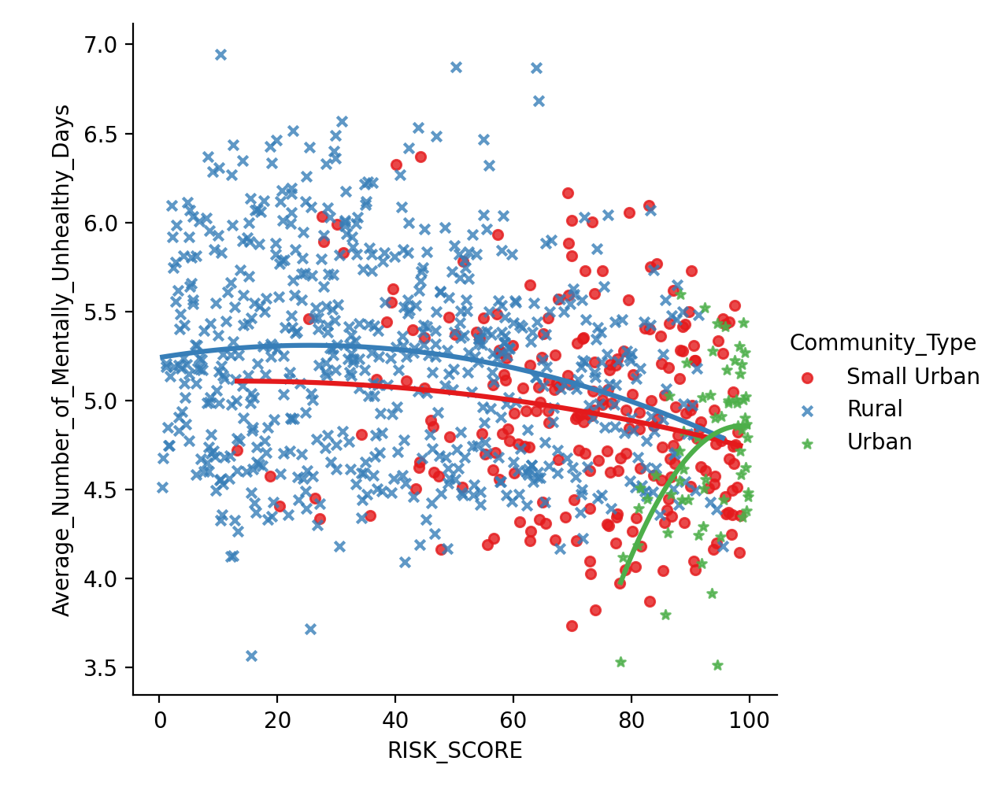

In [178]:
#quadratic model control for community type
sns.lmplot(data=Southeast_county_data, x="RISK_SCORE", y="Average_Number_of_Mentally_Unhealthy_Days", 
           order=2,
           hue = "Community_Type", markers = ["o", "x", "*"],
           palette="Set1",
        ci=None, scatter_kws={"s": 20})

plt.show()

# SE Breakdown of Scores

**Age Adjusted Death Rate**

In [119]:
model_ols_r_allscores_drate= smf.ols(formula='Age_Adjusted_Death_Rate ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_drate.summary())

                               OLS Regression Results                              
Dep. Variable:     Age_Adjusted_Death_Rate   R-squared:                       0.468
Model:                                 OLS   Adj. R-squared:                  0.465
Method:                      Least Squares   F-statistic:                     134.4
Date:                     Thu, 30 Nov 2023   Prob (F-statistic):          5.04e-122
Time:                             20:03:52   Log-Likelihood:                -5478.6
No. Observations:                      924   AIC:                         1.097e+04
Df Residuals:                          917   BIC:                         1.100e+04
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [124]:
SE['EAL_SQ'] = SE['EAL_SCORE']**2

In [140]:
SE['SOVI_SQ'] = SE['SOVI_SCORE']**2
SE['RESL_INV'] = SE['RESL_SCORE'] ** -1

In [134]:
#with squared terms for EAL and SOVI
model_ols_r_allscores_drate_sq= smf.ols(formula='Age_Adjusted_Death_Rate ~ EAL_SCORE + EAL_SQ + SOVI_SCORE + SOVI_SQ + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_drate_sq.summary())
#EAL SQ matters but SOVI SQ does not

                               OLS Regression Results                              
Dep. Variable:     Age_Adjusted_Death_Rate   R-squared:                       0.473
Model:                                 OLS   Adj. R-squared:                  0.469
Method:                      Least Squares   F-statistic:                     102.8
Date:                     Thu, 30 Nov 2023   Prob (F-statistic):          6.17e-122
Time:                             20:50:41   Log-Likelihood:                -5473.8
No. Observations:                      924   AIC:                         1.097e+04
Df Residuals:                          915   BIC:                         1.101e+04
Df Model:                                8                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

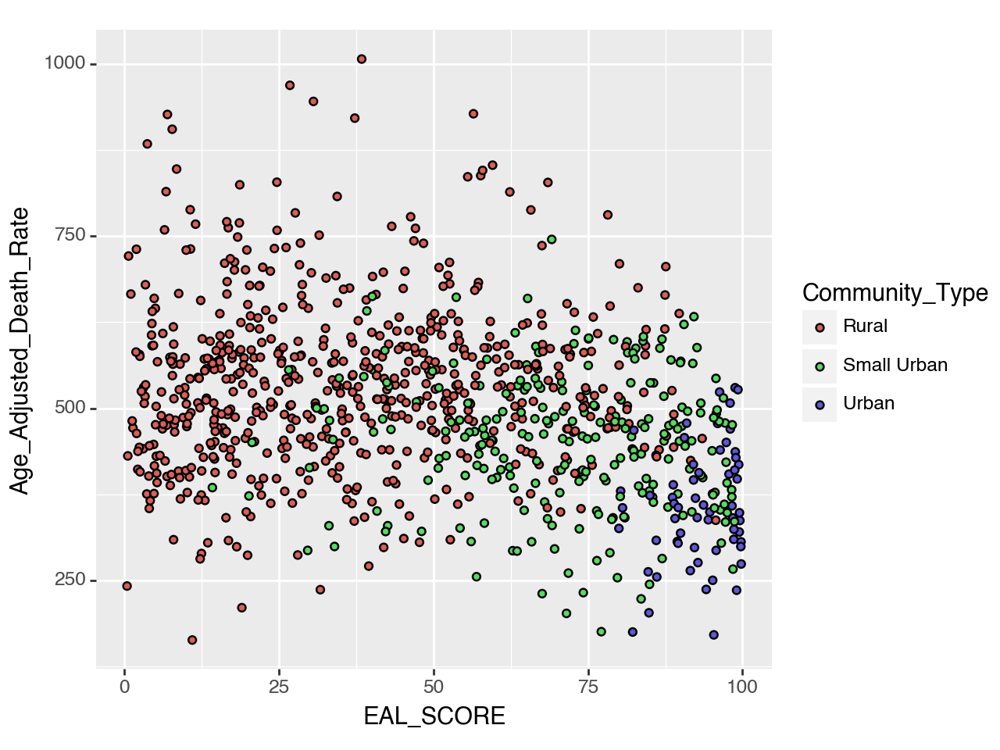

<Figure Size: (640 x 480)>

In [120]:
(ggplot(SE) + aes(x = 'EAL_SCORE', y = 'Age_Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

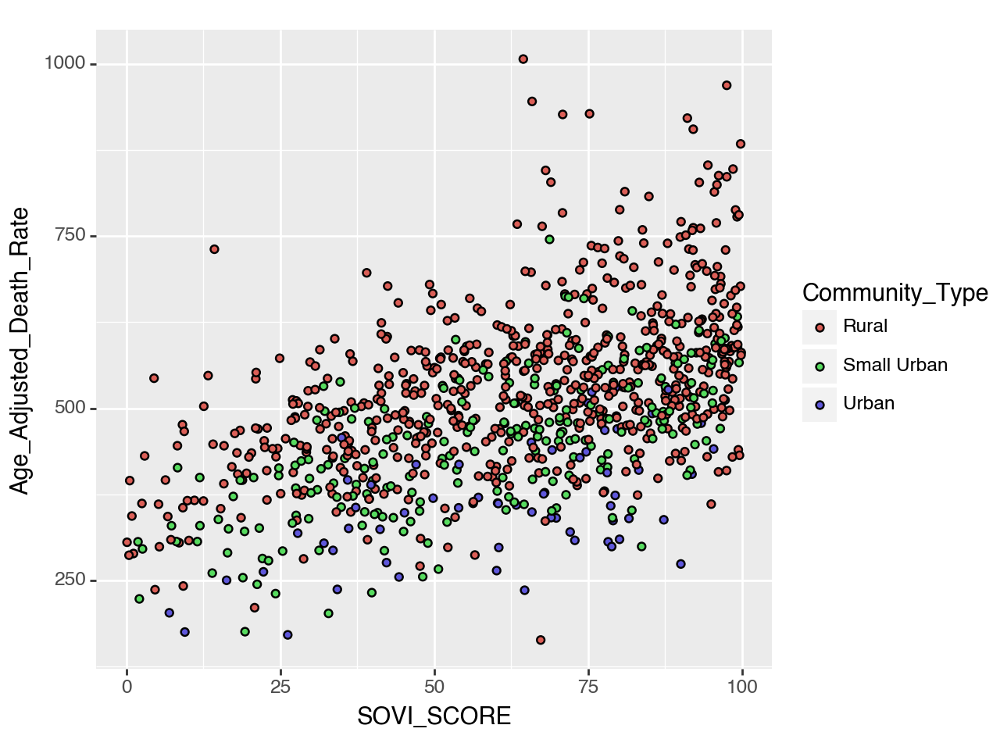

<Figure Size: (640 x 480)>

In [121]:
(ggplot(SE) + aes(x = 'SOVI_SCORE', y = 'Age_Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

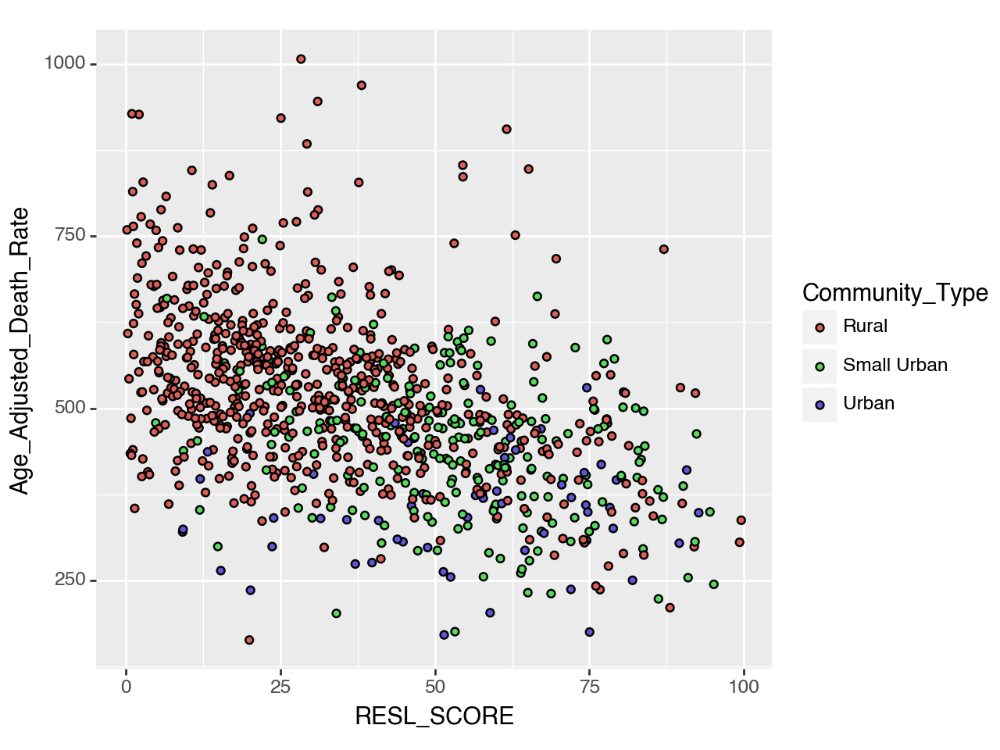

<Figure Size: (640 x 480)>

In [122]:
(ggplot(SE) + aes(x = 'RESL_SCORE', y = 'Age_Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

**Life Expectancy**

In [123]:
model_ols_r_allscores_lifeexp= smf.ols(formula='Life_Expectancy ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_lifeexp.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     105.0
Date:                Thu, 30 Nov 2023   Prob (F-statistic):          1.51e-100
Time:                        20:35:47   Log-Likelihood:                -2059.6
No. Observations:                 922   AIC:                             4133.
Df Residuals:                     915   BIC:                             4167.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

**Mentally Unhealthy Days**

In [116]:
model_ols_r_allscores_mh = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_mh.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.194
Model:                                                   OLS   Adj. R-squared:                  0.188
Method:                                        Least Squares   F-statistic:                     36.72
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           5.36e-40
Time:                                               20:00:28   Log-Likelihood:                -698.13
No. Observations:                                        924   AIC:                             1410.
Df Residuals:                                            917   BIC:                             1444.
Df Model:                                                  6                                         
Covariance Type:                                   nonrobust                      

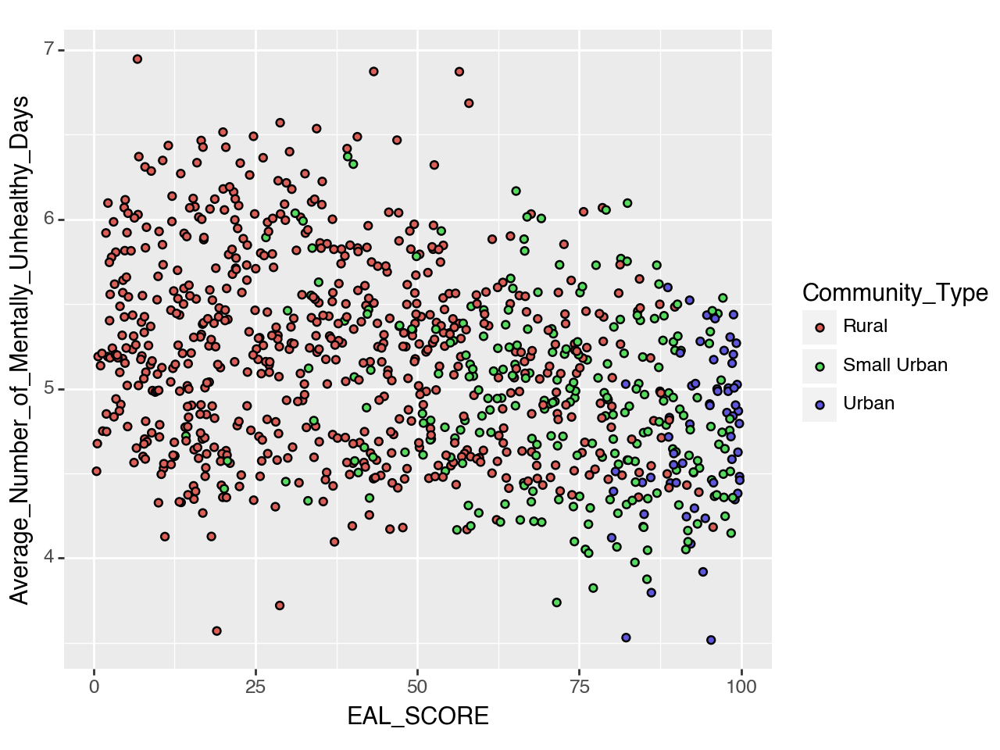

<Figure Size: (640 x 480)>

In [111]:
(ggplot(SE) + aes(x = 'EAL_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

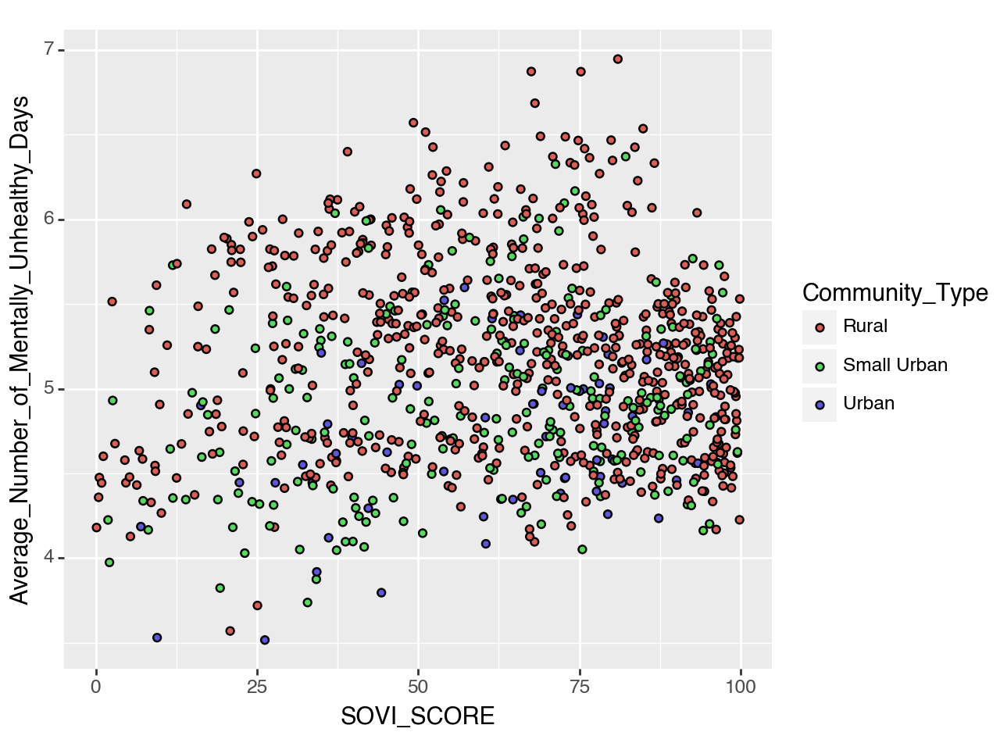

<Figure Size: (640 x 480)>

In [112]:
(ggplot(SE) + aes(x = 'SOVI_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

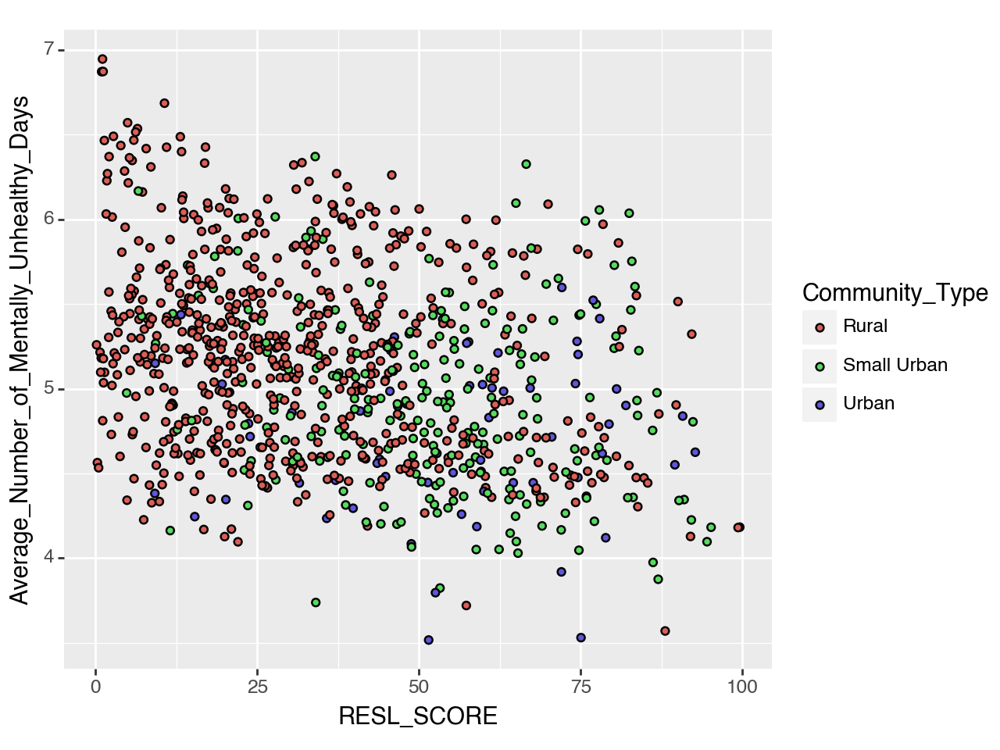

<Figure Size: (640 x 480)>

In [113]:
(ggplot(SE) + aes(x = 'RESL_SCORE', y = 'Average_Number_of_Mentally_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

In [132]:
#with sq SOVI variable
model_ols_r_allscores_mhsq1 = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + SOVI_SQ + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_mhsq1.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.245
Model:                                                   OLS   Adj. R-squared:                  0.240
Method:                                        Least Squares   F-statistic:                     42.56
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           4.00e-52
Time:                                               20:44:53   Log-Likelihood:                -667.51
No. Observations:                                        924   AIC:                             1351.
Df Residuals:                                            916   BIC:                             1390.
Df Model:                                                  7                                         
Covariance Type:                                   nonrobust                      

In [183]:
#with sq sovi and eal variables
model_ols_r_allscores_mhsq2 = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ EAL_SCORE + EAL_SQ + SOVI_SCORE + SOVI_SQ + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_mhsq2.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.249
Model:                                                   OLS   Adj. R-squared:                  0.242
Method:                                        Least Squares   F-statistic:                     37.91
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           3.33e-52
Time:                                               21:56:35   Log-Likelihood:                -665.35
No. Observations:                                        924   AIC:                             1349.
Df Residuals:                                            915   BIC:                             1392.
Df Model:                                                  8                                         
Covariance Type:                                   nonrobust                      

**Physically Unhealthy Days**

In [117]:
model_ols_r_allscores_ph = smf.ols(formula='Average_Number_of_Physically_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_ph.summary())

                                         OLS Regression Results                                        
Dep. Variable:     Average_Number_of_Physically_Unhealthy_Days   R-squared:                       0.409
Model:                                                     OLS   Adj. R-squared:                  0.405
Method:                                          Least Squares   F-statistic:                     105.6
Date:                                         Thu, 30 Nov 2023   Prob (F-statistic):          4.29e-101
Time:                                                 20:00:42   Log-Likelihood:                -680.90
No. Observations:                                          924   AIC:                             1376.
Df Residuals:                                              917   BIC:                             1410.
Df Model:                                                    6                                         
Covariance Type:                                     nonrobust  

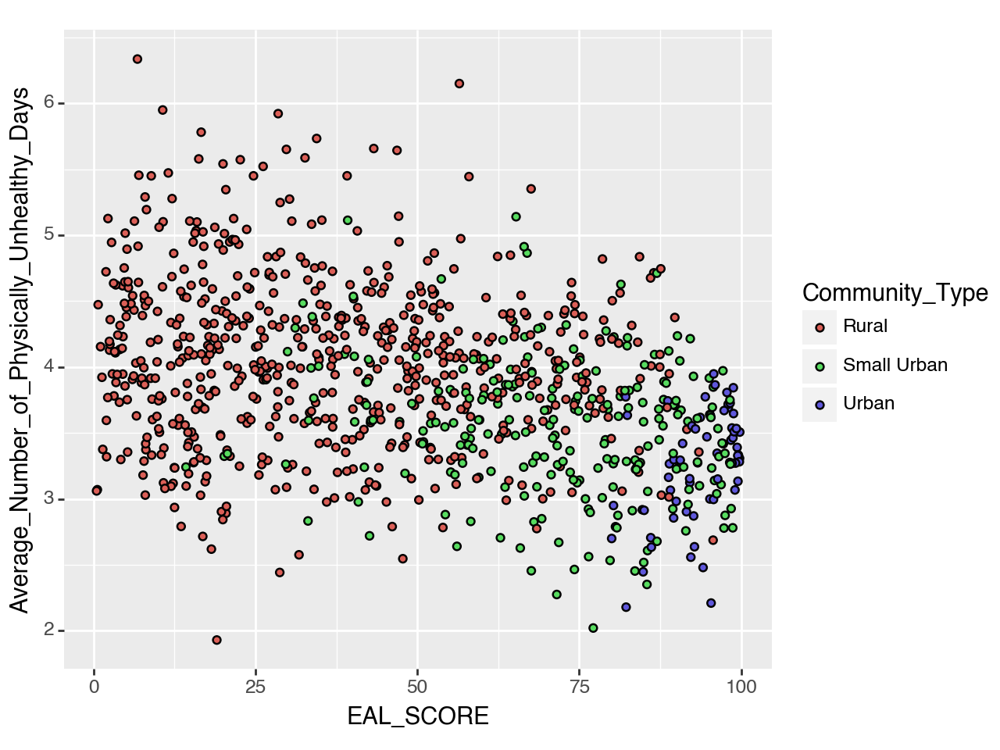

<Figure Size: (640 x 480)>

In [110]:
(ggplot(SE) + aes(x = 'EAL_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

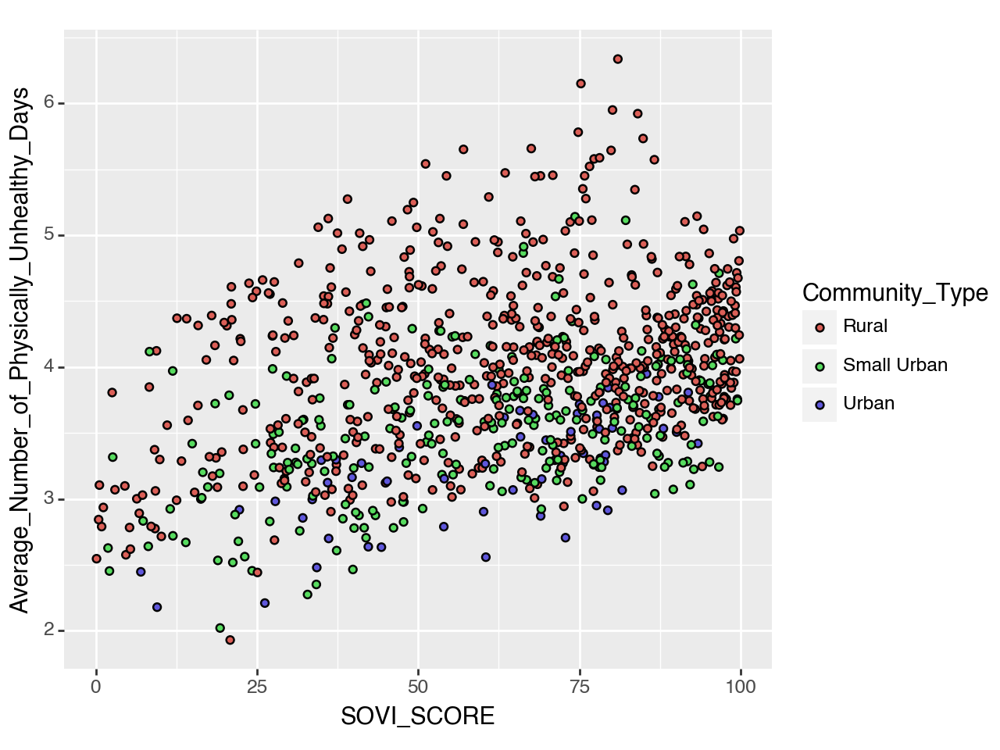

<Figure Size: (640 x 480)>

In [102]:
(ggplot(SE) + aes(x = 'SOVI_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

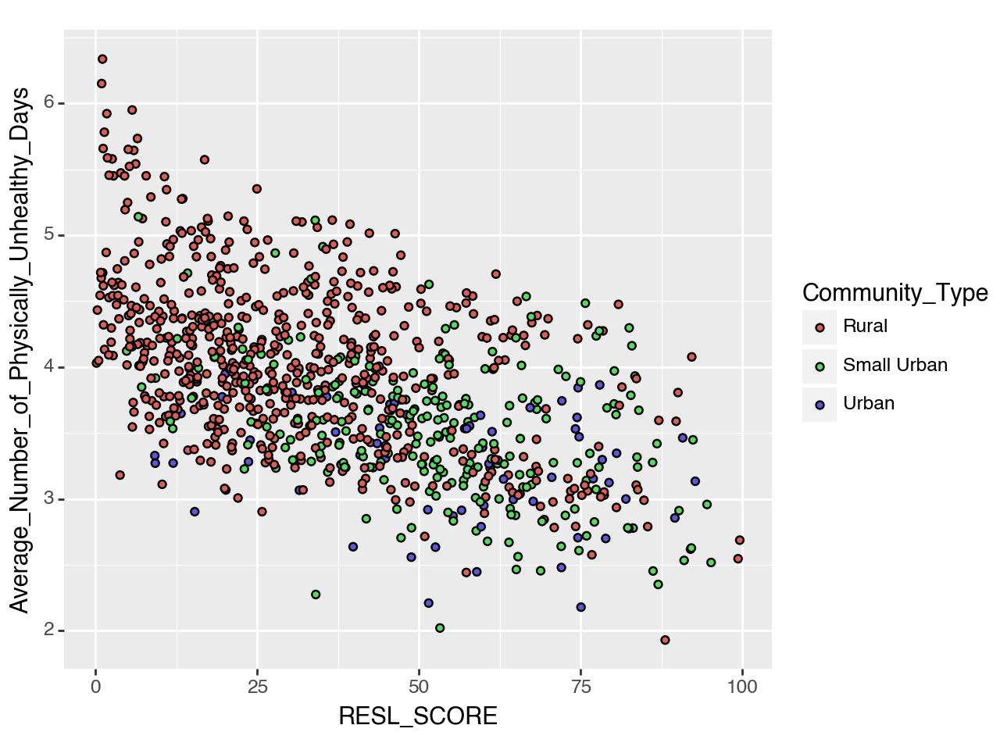

<Figure Size: (640 x 480)>

In [101]:
(ggplot(SE) + aes(x = 'RESL_SCORE', y = 'Average_Number_of_Physically_Unhealthy_Days', fill = "Community_Type") 
 + geom_point())

In [136]:
model_ols_r_allscores_ph2 = smf.ols(formula='Average_Number_of_Physically_Unhealthy_Days ~ EAL_SCORE + EAL_SQ + SOVI_SCORE + RESL_SCORE + Community_Type + Population_Density', data=SE).fit()

print(model_ols_r_allscores_ph2.summary())

#squared version of EAL makes variable not statistically significant

                                         OLS Regression Results                                        
Dep. Variable:     Average_Number_of_Physically_Unhealthy_Days   R-squared:                       0.409
Model:                                                     OLS   Adj. R-squared:                  0.405
Method:                                          Least Squares   F-statistic:                     90.64
Date:                                         Thu, 30 Nov 2023   Prob (F-statistic):          3.02e-100
Time:                                                 20:57:23   Log-Likelihood:                -680.47
No. Observations:                                          924   AIC:                             1377.
Df Residuals:                                              916   BIC:                             1416.
Df Model:                                                    7                                         
Covariance Type:                                     nonrobust  

## No RESL Score in Model

In [126]:
model_ols_r_noresl_lifeexp= smf.ols(formula='Life_Expectancy ~ EAL_SCORE + SOVI_SCORE + Community_Type + Population_Density + Primary_Care_Physicians_Rate + Mental_Health_Provider_Rate', data=SE).fit()

print(model_ols_r_noresl_lifeexp.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.450
Model:                            OLS   Adj. R-squared:                  0.445
Method:                 Least Squares   F-statistic:                     99.53
Date:                Thu, 30 Nov 2023   Prob (F-statistic):          4.27e-106
Time:                        20:39:18   Log-Likelihood:                -1865.6
No. Observations:                 860   AIC:                             3747.
Df Residuals:                     852   BIC:                             3785.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [130]:
model_ols_r_noresl_drate = smf.ols(formula='Age_Adjusted_Death_Rate ~ EAL_SCORE + EAL_SQ + SOVI_SCORE + Community_Type + Population_Density + Primary_Care_Physicians_Rate + Mental_Health_Provider_Rate', data=SE).fit()

print(model_ols_r_noresl_drate.summary())

                               OLS Regression Results                              
Dep. Variable:     Age_Adjusted_Death_Rate   R-squared:                       0.491
Model:                                 OLS   Adj. R-squared:                  0.487
Method:                      Least Squares   F-statistic:                     102.8
Date:                     Thu, 30 Nov 2023   Prob (F-statistic):          1.85e-119
Time:                             20:42:05   Log-Likelihood:                -5070.6
No. Observations:                      860   AIC:                         1.016e+04
Df Residuals:                          851   BIC:                         1.020e+04
Df Model:                                8                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [128]:
model_ols_r_noresl_mh = smf.ols(formula='Average_Number_of_Mentally_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + Community_Type + Population_Density + Primary_Care_Physicians_Rate + Mental_Health_Provider_Rate', data=SE).fit()

print(model_ols_r_noresl_mh.summary())

                                        OLS Regression Results                                       
Dep. Variable:     Average_Number_of_Mentally_Unhealthy_Days   R-squared:                       0.174
Model:                                                   OLS   Adj. R-squared:                  0.168
Method:                                        Least Squares   F-statistic:                     25.70
Date:                                       Thu, 30 Nov 2023   Prob (F-statistic):           5.30e-32
Time:                                               20:40:44   Log-Likelihood:                -670.64
No. Observations:                                        860   AIC:                             1357.
Df Residuals:                                            852   BIC:                             1395.
Df Model:                                                  7                                         
Covariance Type:                                   nonrobust                      

In [129]:
model_ols_r_noresl_ph = smf.ols(formula='Average_Number_of_Physically_Unhealthy_Days ~ EAL_SCORE + SOVI_SCORE + Community_Type + Population_Density + Primary_Care_Physicians_Rate + Mental_Health_Provider_Rate', data=SE).fit()

print(model_ols_r_noresl_ph.summary())

                                         OLS Regression Results                                        
Dep. Variable:     Average_Number_of_Physically_Unhealthy_Days   R-squared:                       0.372
Model:                                                     OLS   Adj. R-squared:                  0.367
Method:                                          Least Squares   F-statistic:                     72.25
Date:                                         Thu, 30 Nov 2023   Prob (F-statistic):           6.00e-82
Time:                                                 20:41:24   Log-Likelihood:                -668.53
No. Observations:                                          860   AIC:                             1353.
Df Residuals:                                              852   BIC:                             1391.
Df Model:                                                    7                                         
Covariance Type:                                     nonrobust  